# Домашнее задание 3

У вас есть данные о полетах. Для каждого клиента известна краткая информация о самом человеке, о типе билета и о рейсе, а также оценки клиента различным аспектам полета.

Для некоторых клиентов известна их удовлетворенность полетом (satisfied или neutral or dissatisfied). По этим данным необходимо обучить модель, предсказывающую удовлетворенность клиентов полетом. Итоговые предсказания нужно сделать для клиентов, для которых ответ неизвестен.

Компания держит все данные в облаке Яндекса в Postgresql. Данные разбиты на смысловые таблицы. Чтобы получить данные, вам необходимо подключиться к базе данных и добыть оттуда данные.

Продуктивной и интересной вам работы!

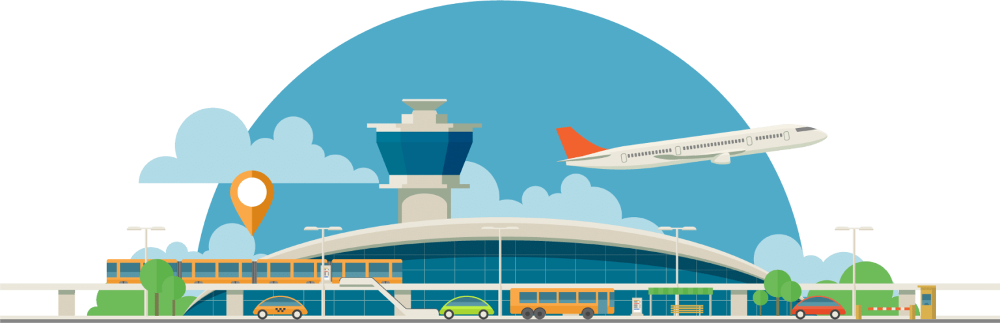

> Задания, <font color='#9933CC'>выделенные фиолетовым</font>, требуют от вас написания кода. <br/> А вопросы, <font color='#FF6600'>выделенные оранжевым</font>, -- текстового ответа.

Оцениваются как код, так и ответы на вопросы. Если нет одного и/или другого, то часть баллов за соответствующее задание без колебаний снимается.

Брать код из открытых источников позволительно. Следование культуре цитирования при этом обязательно

In [1]:
!pip install catboost
!pip install mlxtend --upgrade
!pip install optuna
!pip install lime
!pip install shap
!pip install missingno
!pip install psycopg2-binary
#!pip install xgboost
#!brew install cmake libomp
#!pip install lightgbm

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.7/98.7 MB 6.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 19.6 MB/s eta 0:00:00
  Attempting uninstall: mlxtend
    Found existing installation: mlxtend 0.22.0
    Uninstalling mlxtend-0.22.0:
      Successfully uninstalled mlxtend-0.22.0
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 413.4/413.4 kB 5.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.4/233.4 kB 22.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283835 sha256=8e2e7117dd750f526cf245781182fae86049d56e9256fae05a4c9766fb158a83
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import missingno

import psycopg2
import psycopg2.extras

from mlxtend.plotting import plot_decision_regions
from mlxtend.evaluate import bias_variance_decomp
from graphviz import Source
from sklearn.tree import export_graphviz
from IPython.display import SVG

from sklearn.impute import SimpleImputer
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, roc_auc_score, RocCurveDisplay
from sklearn.preprocessing import OneHotEncoder, FunctionTransformer, StandardScaler
from sklearn.calibration import CalibrationDisplay
from sklearn.isotonic import IsotonicRegression

from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, StackingClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.linear_model import LogisticRegression

from sklearn.feature_selection import VarianceThreshold, SelectKBest, chi2, mutual_info_classif
from sklearn.feature_selection import SequentialFeatureSelector, RFE, SelectFromModel
from sklearn.pipeline import Pipeline
from sklearn.base import TransformerMixin, BaseEstimator

import shap
import lime
import lime.lime_tabular

import optuna

import pickle

np.random.seed(42)


# Data Prep & EDA (3 балла)

## Загрузка и предобработка данных (1.75 балла)

In [3]:
!mkdir -p ~/.postgresql && \
wget "https://storage.yandexcloud.net/cloud-certs/CA.pem" \
    --output-document ~/.postgresql/root.crt && \
chmod 0600 ~/.postgresql/root.crt

--2023-12-30 09:03:57--  https://storage.yandexcloud.net/cloud-certs/CA.pem
Resolving storage.yandexcloud.net (storage.yandexcloud.net)... 213.180.193.243, 2a02:6b8::1d9
Connecting to storage.yandexcloud.net (storage.yandexcloud.net)|213.180.193.243|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3579 (3.5K) [application/x-x509-ca-cert]
Saving to: ‘/root/.postgresql/root.crt’

/root/.postgresql/r 100%[===================>]   3.50K  --.-KB/s    in 0s      

2023-12-30 09:03:58 (1005 MB/s) - ‘/root/.postgresql/root.crt’ saved [3579/3579]



(0.5 балла) <font color='#9933CC'>Подключитесь к БД при помощи `psycopg2.connect()` и напишите SQL-запрос, объединяющий 3 нужные таблицы в одну</font>.
Список столбцов таблиц добудьте самостоятельно.

<font color='#9933CC'>Результат запроса поместите в `pd.DataFrame`. Индексом получившегося датафрейма сделайте столбец 'id'</font>

> Не забудьте закрыть соединение. Или открывайте соединение, используя менеджер контекста `with as`, который закроет его автоматически

### Параметры соединения
```
host=rc1b-70q90cunwkzx49mj.mdb.yandexcloud.net
port=6432
sslmode=verify-full
dbname=db_flights
user=mlhs_student
password=mlhs_student
target_session_attrs=read-write```
```

### Схема БД

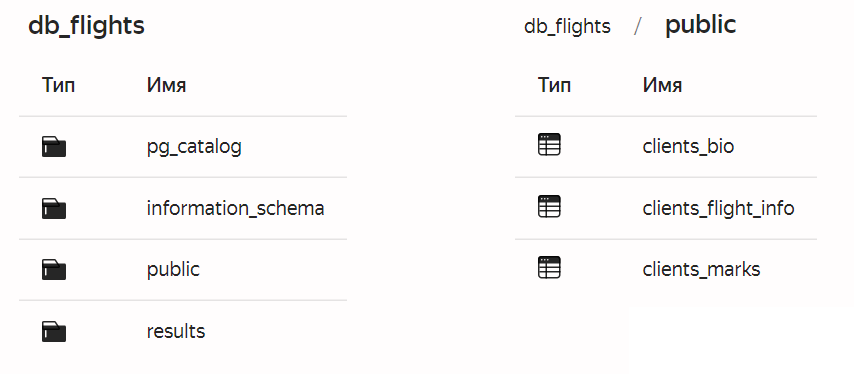

In [4]:
# your code below
conn = psycopg2.connect(
    '''
    host=rc1b-70q90cunwkzx49mj.mdb.yandexcloud.net
    port=6432
    sslmode=verify-full
    dbname=db_flights
    user=mlhs_student
    password=mlhs_student
    target_session_attrs=read-write
    '''                )

try:

    with conn:
        with conn.cursor() as curs:
            curs.execute("SELECT * FROM clients_bio left JOIN clients_flight_info\
             USING (id) left JOIN clients_marks using (id)")
            df = curs.fetchall()

    with conn:
        with conn.cursor() as curs:
            curs.execute("SELECT column_name FROM information_schema.columns \
            where table_schema = 'public' and table_name = 'clients_bio'")
            cols_bio = curs.fetchall()

    with conn:
        with conn.cursor() as curs:
            curs.execute("SELECT column_name FROM information_schema.columns \
            where table_schema = 'public' and table_name = 'clients_marks'")
            cols_marks = curs.fetchall()

    with conn:
        with conn.cursor() as curs:
            curs.execute("SELECT column_name FROM information_schema.columns \
            where table_schema = 'public' and table_name = 'clients_flight_info'")
            cols_flight = curs.fetchall()

finally:
    conn.close()

In [5]:
cols_bio = [x[0] for x in cols_bio]
cols_marks = [x[0] for x in cols_marks]
cols_flight = [x[0] for x in cols_flight]

columns = cols_bio + cols_flight[1:] + cols_marks[1:]
columns

['id',
 'gender',
 'age',
 'Customer Type',
 'Type of Travel',
 'class',
 'Flight Distance',
 'Departure Delay in Minutes',
 'Arrival Delay in Minutes',
 'Inflight wifi service',
 'Departure/Arrival time convenient',
 'Ease of Online booking',
 'Gate location',
 'Food and drink',
 'Online boarding',
 'Seat comfort',
 'Inflight entertainment',
 'On-board service',
 'Leg room service',
 'Baggage handling',
 'Checkin service',
 'Inflight service',
 'cleanliness',
 'satisfaction']

In [6]:
df = pd.DataFrame(df, columns=columns)
df = df.set_index('id')
df

,gender,age,Customer Type,Type of Travel,class,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Inflight wifi service,Departure/Arrival time convenient,...,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,cleanliness,satisfaction
id,,,,,,,,,,,,,,,,,,,,,
7,Male,43.0,Loyal Customer,Business travel,Business,1963.0,0.0,0.0,3.0,3.0,...,4.0,5.0,5.0,5.0,5.0,5.0,4.0,5.0,4.0,satisfied
13,Male,24.0,disloyal Customer,Business travel,Eco,453.0,16.0,30.0,2.0,2.0,...,2.0,5.0,5.0,2.0,4.0,4.0,2.0,4.0,5.0,neutral or dissatisfied
18,Female,61.0,Loyal Customer,Personal Travel,Eco,821.0,0.0,0.0,2.0,5.0,...,1.0,5.0,5.0,5.0,2.0,5.0,5.0,5.0,1.0,neutral or dissatisfied
31,Male,35.0,disloyal Customer,Business travel,Business,212.0,0.0,0.0,2.0,2.0,...,2.0,2.0,2.0,4.0,5.0,5.0,5.0,4.0,2.0,neutral or dissatisfied
39,Female,46.0,Loyal Customer,Business travel,Business,67.0,0.0,0.0,3.0,3.0,...,5.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,5.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129838,Female,59.0,Loyal Customer,Personal Travel,Eco,308.0,32.0,24.0,3.0,5.0,...,5.0,5.0,3.0,3.0,3.0,3.0,4.0,3.0,4.0,neutral or dissatisfied
129839,Male,61.0,Loyal Customer,Personal Travel,Eco,337.0,0.0,0.0,2.0,4.0,...,2.0,3.0,3.0,4.0,5.0,5.0,5.0,4.0,3.0,neutral or dissatisfied
129846,Male,44.0,Loyal Customer,Personal Travel,Eco,447.0,0.0,0.0,2.0,5.0,...,2.0,5.0,5.0,4.0,2.0,4.0,3.0,4.0,5.0,neutral or dissatisfied


In [7]:
assert df.shape == (129_549, 23)

(0.25 балла) <font color='#9933CC'>Преобразуйте числовые столбцы в `float`. Проверьте, есть ли в датафрейме пропуски и выбросы (в том числе в категориальных признаках)</font>.

In [8]:
# your code below

df[df.columns[5:22]] = df.iloc[:, 5:22].astype(float)
df['age'] = df['age'].astype(float)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 129549 entries, 7 to 129876
Data columns (total 23 columns):
 #   Column                             Non-Null Count   Dtype  
---  ------                             --------------   -----  
 0   gender                             129549 non-null  object 
 1   age                                129234 non-null  float64
 2   Customer Type                      129549 non-null  object 
 3   Type of Travel                     129549 non-null  object 
 4   class                              129549 non-null  object 
 5   Flight Distance                    129455 non-null  float64
 6   Departure Delay in Minutes         129442 non-null  float64
 7   Arrival Delay in Minutes           129042 non-null  float64
 8   Inflight wifi service              129505 non-null  float64
 9   Departure/Arrival time convenient  129500 non-null  float64
 10  Ease of Online booking             129506 non-null  float64
 11  Gate location                      1295

In [9]:
df.isnull().sum()

gender                                 0
age                                  315
Customer Type                          0
Type of Travel                         0
class                                  0
Flight Distance                       94
Departure Delay in Minutes           107
Arrival Delay in Minutes             507
Inflight wifi service                 44
Departure/Arrival time convenient     49
Ease of Online booking                43
Gate location                         37
Food and drink                        50
Online boarding                       46
Seat comfort                          47
Inflight entertainment                45
On-board service                      44
Leg room service                      46
Baggage handling                      48
Checkin service                       42
Inflight service                      63
cleanliness                           37
satisfaction                           0
dtype: int64

In [10]:
df.describe()

,age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,cleanliness
count,129234.000000,129455.000000,129442.000000,129042.000000,129505.000000,129500.000000,129506.000000,129512.000000,129499.000000,129503.000000,129502.000000,129504.000000,129505.000000,129503.000000,129501.000000,129507.000000,129486.000000,129512.000000
mean,40.116951,1322.922158,15.809026,16.656499,2.732327,3.062131,2.760722,2.981708,3.208141,3.256782,3.445669,3.361232,3.387259,3.355976,3.635872,3.309976,3.646927,3.289780
std,20.376129,4517.816532,93.276882,109.285072,1.360033,1.559627,1.431048,1.312873,1.357546,1.381888,1.349713,1.366908,1.335697,1.361670,1.222039,1.298827,1.218748,1.347466
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,414.000000,0.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000
50%,40.000000,846.000000,0.000000,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000
75%,51.000000,1744.000000,12.000000,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000
max,621.000000,379620.000000,22227.000000,14006.000000,45.000000,45.000000,45.000000,36.000000,45.000000,40.000000,45.000000,45.000000,45.000000,40.000000,40.000000,45.000000,40.000000,45.000000


<Axes: ylabel='Frequency'>

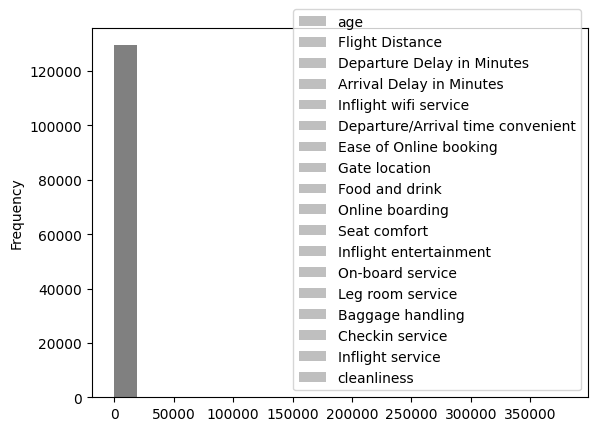

In [11]:
df.plot(kind='hist', bins=20, stacked=False, alpha=.5, color='grey')

(0.5 балла) <font color='#9933CC'>Воспользуйтесь модулем `missingno` для визуализации пропусков в датафрейме</font>

Нас интересует `matrix` пропущенных значений и столбцатая диаграмма в логарифмированной шкале (*пропусков немного => по обычной не будет видно, в каких столбцах их больше*)

<Axes: >

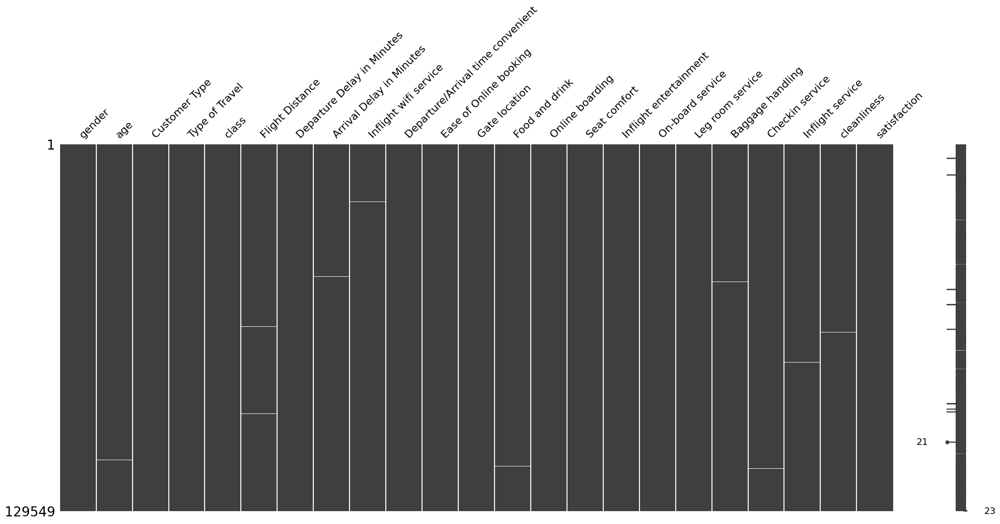

In [12]:
# your code below
missingno.matrix(df)

FixedFormatter should only be used together with FixedLocator


<Axes: >

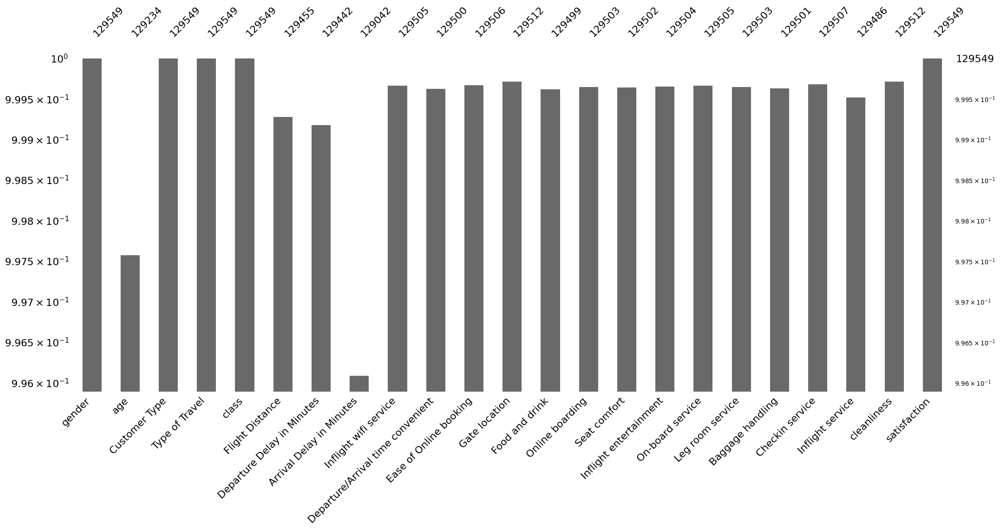

In [13]:
# your code below
missingno.bar(df,log=True)

In [14]:
df_train = df[df.satisfaction != '-']
df_train

,gender,age,Customer Type,Type of Travel,class,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Inflight wifi service,Departure/Arrival time convenient,...,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,cleanliness,satisfaction
id,,,,,,,,,,,,,,,,,,,,,
7,Male,43.0,Loyal Customer,Business travel,Business,1963.0,0.0,0.0,3.0,3.0,...,4.0,5.0,5.0,5.0,5.0,5.0,4.0,5.0,4.0,satisfied
13,Male,24.0,disloyal Customer,Business travel,Eco,453.0,16.0,30.0,2.0,2.0,...,2.0,5.0,5.0,2.0,4.0,4.0,2.0,4.0,5.0,neutral or dissatisfied
18,Female,61.0,Loyal Customer,Personal Travel,Eco,821.0,0.0,0.0,2.0,5.0,...,1.0,5.0,5.0,5.0,2.0,5.0,5.0,5.0,1.0,neutral or dissatisfied
31,Male,35.0,disloyal Customer,Business travel,Business,212.0,0.0,0.0,2.0,2.0,...,2.0,2.0,2.0,4.0,5.0,5.0,5.0,4.0,2.0,neutral or dissatisfied
39,Female,46.0,Loyal Customer,Business travel,Business,67.0,0.0,0.0,3.0,3.0,...,5.0,4.0,4.0,4.0,4.0,4.0,5.0,4.0,5.0,satisfied
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129831,Female,28.0,Loyal Customer,Personal Travel,Eco,447.0,23.0,16.0,1.0,3.0,...,1.0,3.0,3.0,1.0,1.0,4.0,1.0,5.0,3.0,neutral or dissatisfied
129837,Male,66.0,Loyal Customer,Personal Travel,Eco,337.0,199.0,213.0,2.0,4.0,...,5.0,5.0,5.0,2.0,4.0,5.0,5.0,4.0,5.0,neutral or dissatisfied
129838,Female,59.0,Loyal Customer,Personal Travel,Eco,308.0,32.0,24.0,3.0,5.0,...,5.0,5.0,3.0,3.0,3.0,3.0,4.0,3.0,4.0,neutral or dissatisfied


Разобьем датасет на тренировочную и тестовую части. Тестовую часть отложим надолго -- до самого конца этого ноутбука

In [15]:
assert df_train.shape == (103_644, 23)

In [16]:
df_test = df[df.satisfaction == '-'].drop('satisfaction', axis=1)
df_test

,gender,age,Customer Type,Type of Travel,class,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Inflight wifi service,Departure/Arrival time convenient,...,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,cleanliness
id,,,,,,,,,,,,,,,,,,,,,
55,Male,36.0,Loyal Customer,Business travel,Business,3655.0,40.0,71.0,1.0,1.0,...,1.0,3.0,3.0,3.0,3.0,3.0,1.0,4.0,3.0,2.0
79,Female,70.0,Loyal Customer,Personal Travel,Eco,108.0,50.0,41.0,5.0,4.0,...,4.0,4.0,4.0,3.0,3.0,0.0,3.0,5.0,3.0,5.0
126,Male,66.0,Loyal Customer,Personal Travel,Eco,562.0,88.0,84.0,2.0,5.0,...,5.0,2.0,5.0,5.0,3.0,5.0,2.0,5.0,5.0,5.0
199,Female,60.0,Loyal Customer,Business travel,Business,3756.0,36.0,24.0,4.0,4.0,...,2.0,4.0,5.0,4.0,4.0,4.0,4.0,5.0,4.0,5.0
263,Male,43.0,Loyal Customer,Personal Travel,Business,802.0,0.0,0.0,1.0,2.0,...,2.0,3.0,3.0,2.0,2.0,1.0,2.0,3.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129750,Male,38.0,Loyal Customer,Business travel,Eco,337.0,92.0,82.0,4.0,3.0,...,4.0,5.0,4.0,4.0,4.0,5.0,4.0,5.0,3.0,4.0
129771,Male,16.0,Loyal Customer,Personal Travel,Eco,308.0,2.0,0.0,3.0,4.0,...,1.0,3.0,5.0,1.0,4.0,2.0,5.0,5.0,4.0,1.0
129798,Female,43.0,Loyal Customer,Personal Travel,Eco,308.0,0.0,0.0,2.0,4.0,...,3.0,5.0,5.0,4.0,4.0,2.0,4.0,4.0,4.0,5.0


In [17]:
assert df_test.shape == (25_905, 22)

Разбиваем данные на трейн и валидацию. Не меняйте сид

In [18]:
X_train, X_val, y_train, y_val = train_test_split(df_train.drop('satisfaction', axis=1), df_train.satisfaction, test_size=0.3, random_state=42)

In [19]:
assert X_train.shape == (72_550, 22)
assert X_val.shape == (31_094, 22)

(0.25 балла) <font color='#9933CC'>Заполните пропуски в данных наиболее часто встречающимся значением</font>.
Обратите внимание, что правильная стратегия заполнения пропусков выглядит так:

* посчитать моды для `X_train`
* ими заполнить пропуски в `X_train`, `X_val` и `df_test`

Было бы неплохо воспользоваться другой стратегией: восстановать пропуски `KNNImputer`'ом или `IterativeImputer`'ом. Но для признаков в нашей задаче они в чистом виде бы, увы, скорее, не подошли. Импьютеры возвращали бы вещественные значения, а в нашей задаче все признаки целые.

В общем, для изящного и удобного для применения в пайплайне заполнения пропусков, пришлось бы кодить самописные классы. Этим можете заняться в бонусной части.

In [20]:
Y = df.replace(['nan'], None)
Y.isna().sum()

gender                                 0
age                                  315
Customer Type                         77
Type of Travel                       101
class                                116
Flight Distance                       94
Departure Delay in Minutes           107
Arrival Delay in Minutes             507
Inflight wifi service                 44
Departure/Arrival time convenient     49
Ease of Online booking                43
Gate location                         37
Food and drink                        50
Online boarding                       46
Seat comfort                          47
Inflight entertainment                45
On-board service                      44
Leg room service                      46
Baggage handling                      48
Checkin service                       42
Inflight service                      63
cleanliness                           37
satisfaction                           0
dtype: int64

Как видно выше, пропуски встречаются не только в числовых, но и в категориальных признаках.

In [21]:
# your code below
def skip_filler(df):
    df = df.replace(['nan'], None)
    cat_columns = ['Customer Type', 'Type of Travel', 'class' ]
    num_columns = df.select_dtypes(include=[float]).columns.tolist()
    columns = cat_columns + num_columns

    for col in columns:
        df[col] = df[col].fillna(X_train[col].mode()[0])

    return df

In [22]:
X_train = skip_filler(X_train)
X_val = skip_filler(X_val)
df_test = skip_filler(df_test)

In [23]:
Y = X_train.replace(['nan'], None)
Y.isna().sum()

gender                               0
age                                  0
Customer Type                        0
Type of Travel                       0
class                                0
Flight Distance                      0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
cleanliness                          0
dtype: int64

<font color='#9933CC'>Выведите основные статистики по числовым и категориальным столбцам таблицы `X_train`</font>

In [24]:
# the place for you to code
X_train.describe()

,age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,cleanliness
count,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000,72550.000000
mean,40.098856,1329.018332,15.859366,16.645968,2.733687,3.065017,2.761006,2.982688,3.209318,3.256513,3.445665,3.362150,3.383101,3.352364,3.630255,3.309056,3.640234,3.291178
std,20.658196,4764.369357,70.861937,97.990293,1.362172,1.552254,1.414843,1.316648,1.349963,1.372739,1.346077,1.360862,1.333758,1.360180,1.227853,1.293114,1.215114,1.343302
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,413.000000,0.000000,0.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,3.000000,3.000000,2.000000
50%,40.000000,844.000000,0.000000,0.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,3.000000
75%,51.000000,1744.000000,12.000000,13.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,4.000000,4.000000,4.000000,5.000000,4.000000,5.000000,4.000000
max,544.000000,379620.000000,9282.000000,11760.000000,45.000000,45.000000,28.000000,36.000000,36.000000,32.000000,45.000000,40.000000,45.000000,36.000000,40.000000,45.000000,36.000000,45.000000


In [25]:
X_train.select_dtypes(include=[object]).describe()

,gender,Customer Type,Type of Travel,class
count,72550,72550,72550,72550
unique,2,2,2,3
top,Female,Loyal Customer,Business travel,Business
freq,36816,59406,50054,34793


<font color='#FF6600'>Что вы можете сказать про распределение значений признаков?</font>

Практически во всех числовых столбцах есть выбросы, но их не очень много.
Большинство признаков с оценками клиентов имеют похожее распределение.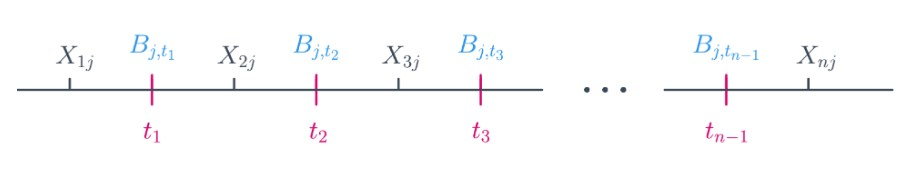

In [26]:
# answer here, feel free to change into markdown



(0.25 балла) <font color='#9933CC'>Удалите строки c выбросами в числовых столбцах</font> (для трейна и валидации; тест оставьте без изменений). Выбросами считайте значения признака, строго превышающие 0.996-квантиль


---
<br/>

*Откуда взялся именно 0.996-квантиль?*

*В рамках анализа данных на выборсы вы вполне могли заметить, какие значения признаков встречаются редко. В среднем для всех признаков эти значения начинаются ~в этом квантиле*

In [27]:
def quantile_killer(dframe):
    columns = dframe.select_dtypes(include=[float]).columns.tolist()
    for col in columns:
        thr = dframe[col].quantile(q=0.996)
        dframe[col] = dframe[col].loc[lambda x : x <= thr]
    return dframe

In [28]:
# place for you to code

numerical_columns = X_train.select_dtypes(include=[float]).columns.tolist()

outliers_threshold = X_train.quantile(0.996, numeric_only=True)

train_mask = X_train[numerical_columns].le(outliers_threshold)
train_ind = X_train[numerical_columns][train_mask].dropna().index
X_train = X_train.loc[train_ind]
y_train = y_train.loc[train_ind]

val_mask = X_val[numerical_columns].le(outliers_threshold)
val_ind = X_val[numerical_columns][val_mask].dropna().index
X_val = X_val.loc[val_ind]
y_val = y_val.loc[val_ind]

In [29]:
X_train.isna().sum()

gender                               0
age                                  0
Customer Type                        0
Type of Travel                       0
class                                0
Flight Distance                      0
Departure Delay in Minutes           0
Arrival Delay in Minutes             0
Inflight wifi service                0
Departure/Arrival time convenient    0
Ease of Online booking               0
Gate location                        0
Food and drink                       0
Online boarding                      0
Seat comfort                         0
Inflight entertainment               0
On-board service                     0
Leg room service                     0
Baggage handling                     0
Checkin service                      0
Inflight service                     0
cleanliness                          0
dtype: int64

In [30]:
X_train['age'].unique()

array([29., 45.,  8., 48., 25., 43., 56., 64., 23., 19., 39., 53., 31.,
       42., 58., 28., 54., 37., 30., 38., 27., 69., 41., 55., 49., 33.,
       24., 46., 66., 60., 11., 40., 68., 36., 50., 44., 51., 20., 14.,
       57.,  9., 12., 62., 65., 35., 32., 52., 34., 18., 71., 15., 47.,
       21., 26., 13., 16., 22., 63., 61., 67., 70., 59., 17., 10.,  0.,
        7., 78., 76., 77., 79., 73., 75., 74., 72., 80.])

In [31]:
# assert X_train.shape == (71_369, 22) эти ассерты у большинства студентов не проходили
# assert X_val.shape == (30_609, 22) и это совершенно не принципиально
assert df_test.shape == (25_905, 22)

## EDA (1.25 балла)

Создадим переменные с перечислениями столбцов разного типа

In [32]:
continuous_cols = ['age', 'Flight Distance', 'Departure Delay in Minutes', 'Arrival Delay in Minutes']
ordinal_cols = list(set(df.select_dtypes(include='number').columns) - set(continuous_cols))
categorical_cols = list(df.select_dtypes(include='object').columns)[:-1]

In [33]:
assert len(continuous_cols + ordinal_cols + categorical_cols) == 22

(0.5 балла) <font color='#9933CC'>Напишите процедуры для отрисовки графиков</font>

* Для признаков, которые мы выделили как порядковые, отображайте только `countplot`
* Для тех, что считаем континуальными, -- гистограмму распределения признака и ящик с усами (inline)
* Для категориальных -- только `countplot`

Обязательно выделяйте таргет разными цветами. Мы же хотим в конечном итоге понять, чем удовлетворенные клиенты отличаются от недовольных.

> Все графики и их оси обязательно должны быть подписаны, легенда на графике также необходима

In [34]:
def plot_ordinal(cols, df, y):
    """Draws countplots for all columns in 'cols' with informative title"""

    for feature in cols:
        sns.countplot(data=df, x=feature, hue=y)
        plt.title(f'{feature} distribuition')
        plt.xlim(-0.5, 5.5)
        plt.show()
    pass

In [35]:
def plot_continuous(cols, df, y):
    """Draws kdeplots and boxplots in one row
    for all columns in 'cols' with informative title
    """

    fig, axs = plt.subplots(len(cols), 2, layout='constrained')
    fig.set_size_inches(16, len(cols)*6)

    titles = ('distribution', 'boxplot by target')
    hue_order = ['neutral or dissatisfied', 'satisfied']

    for ax, col in zip(axs, cols):
        ax_kde, ax_box = ax
        sns.kdeplot(df, x=col, hue=y, hue_order=hue_order, ax=ax_kde)
        sns.boxplot(df, x=col, y=y, hue=y, hue_order=hue_order, ax=ax_box)
        for a, ttl in zip((ax_kde, ax_box), titles):
            a.set_title(f'{col} {ttl}', fontsize=10)
            a.tick_params(axis='both', labelsize=8)
            a.xaxis.label.set_size(8)
            a.yaxis.label.set_size(8)

        plt.setp(ax_kde.get_legend().get_texts(), fontsize=8)
        plt.setp(ax_kde.get_legend().get_title(), fontsize=10)

    plt.show()
    pass

In [36]:
def plot_categorical(cols, df, y):
    """Draws countplots for all columns in 'cols' with informative title"""

    for feature in cols:
        sns.countplot(data=df, x=feature, hue=y)
        plt.title(f'{feature} distribuition')
        plt.show()
    pass

<font color='#9933CC'>Вызовите все 3 написанные процедуры для соответствующих колонок `X_train`. Отдельно визуализируйте распределение таргета в трейне</font>

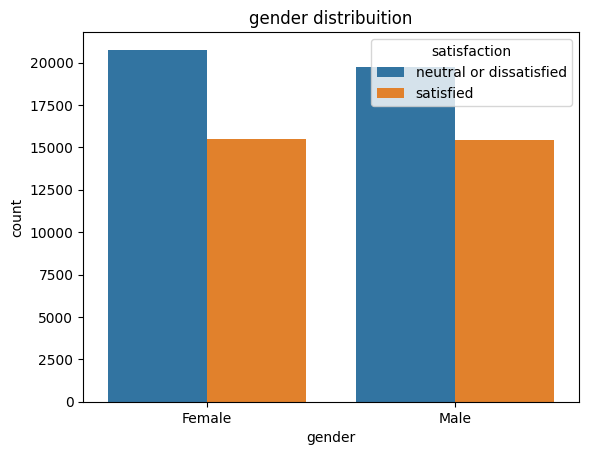

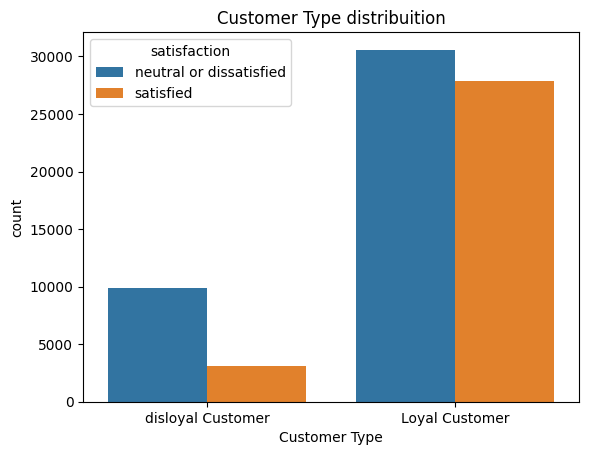

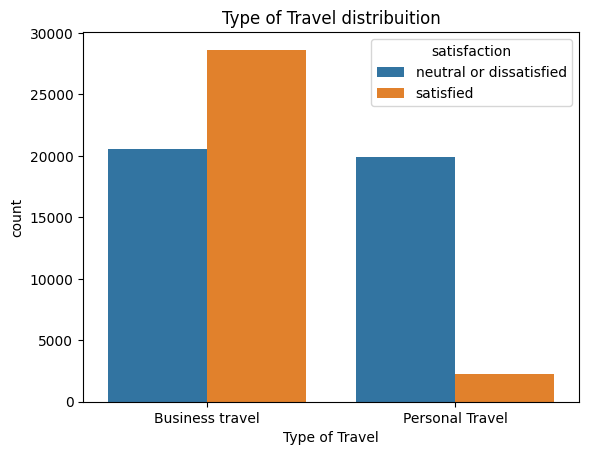

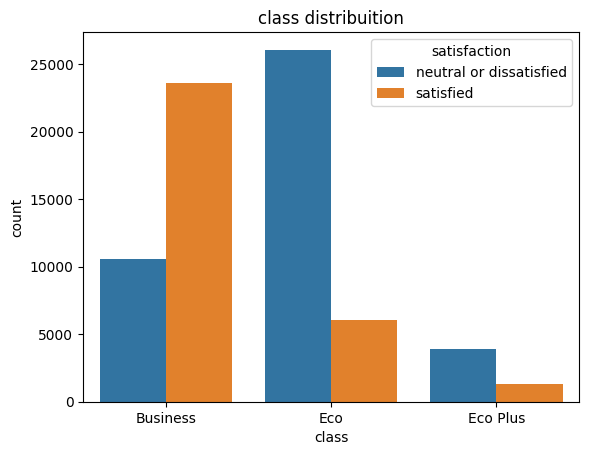

In [37]:
plot_categorical(categorical_cols, X_train, y_train)

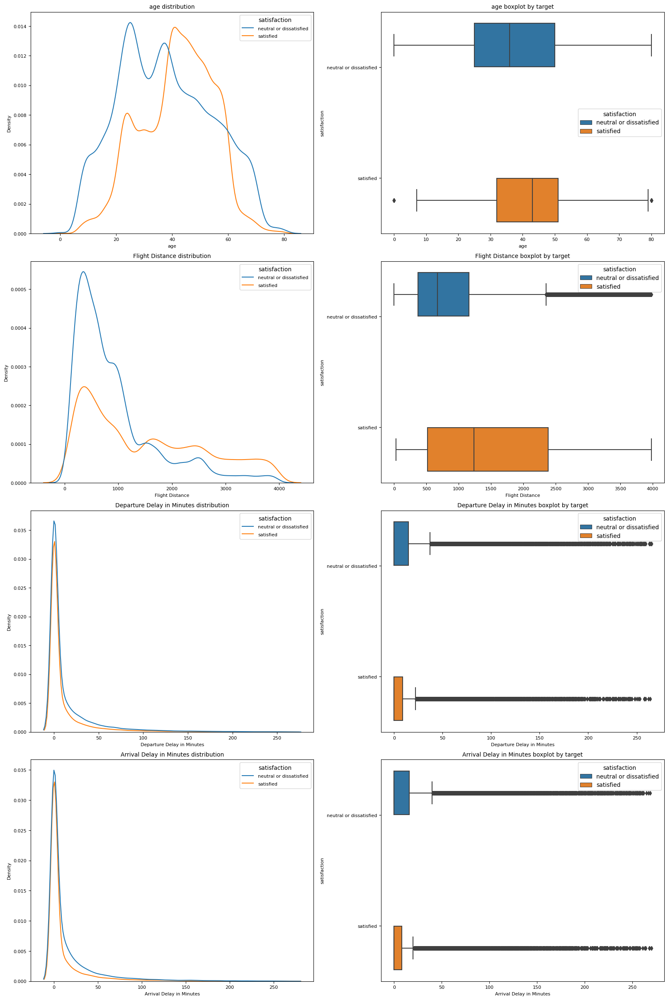

In [38]:
plot_continuous(continuous_cols, X_train, y_train)

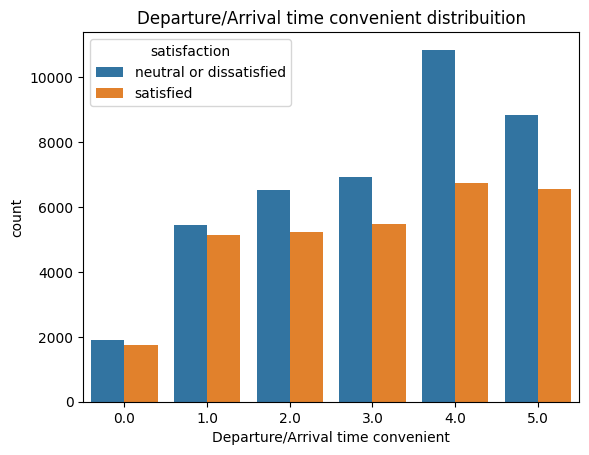

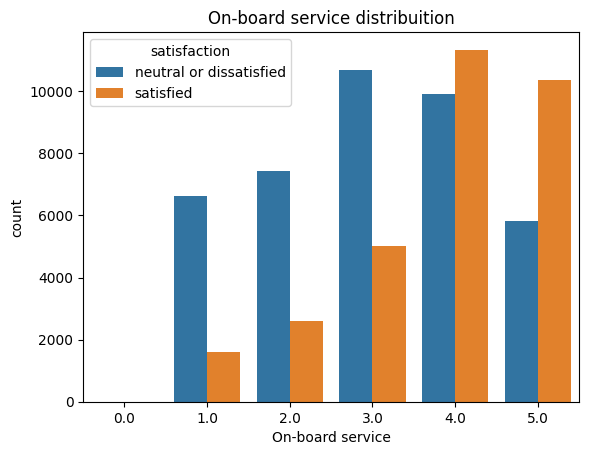

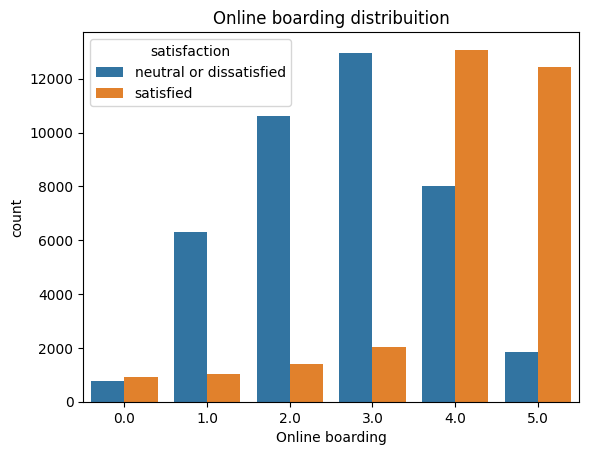

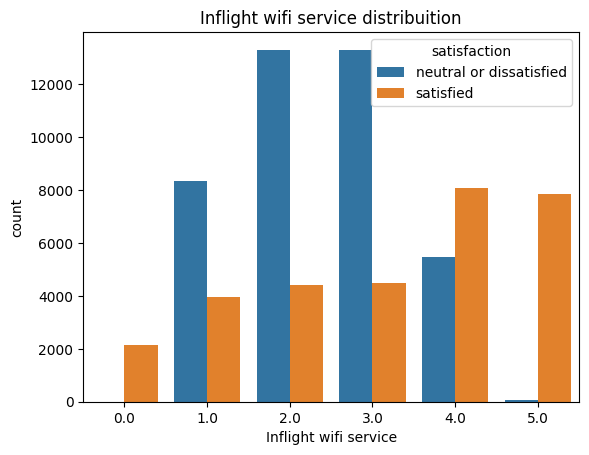

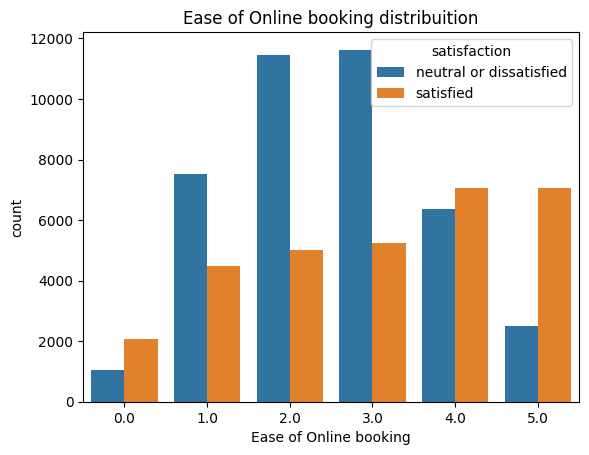

...

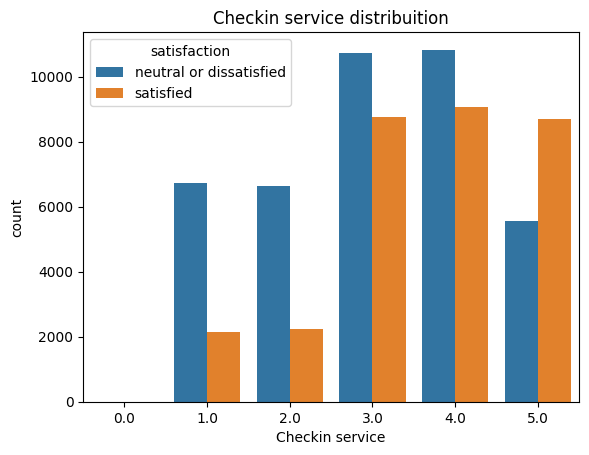

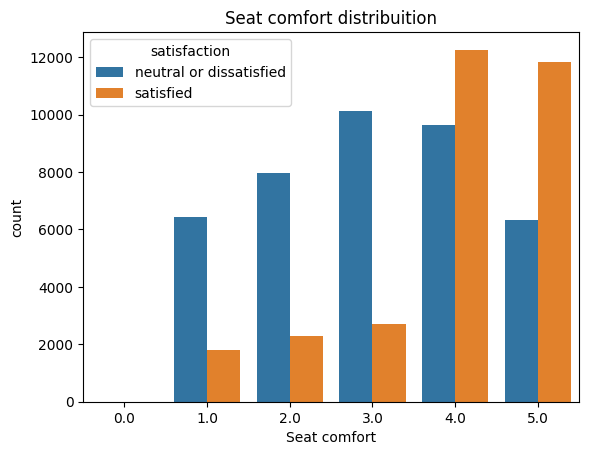

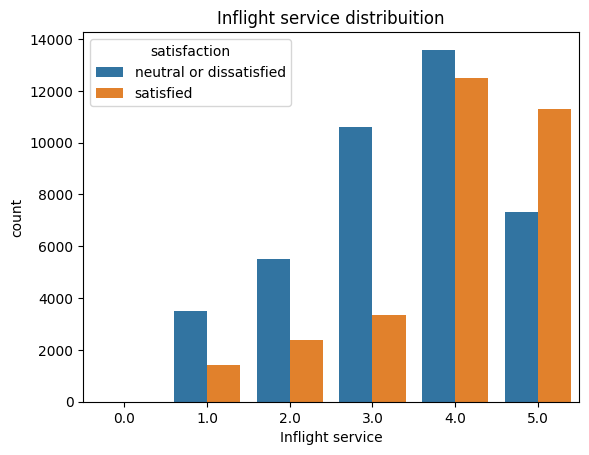

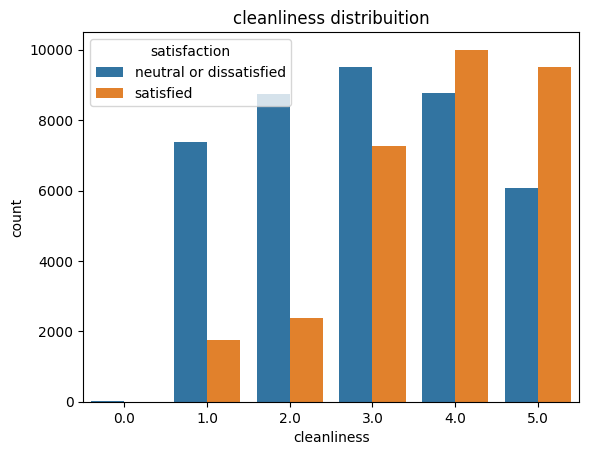

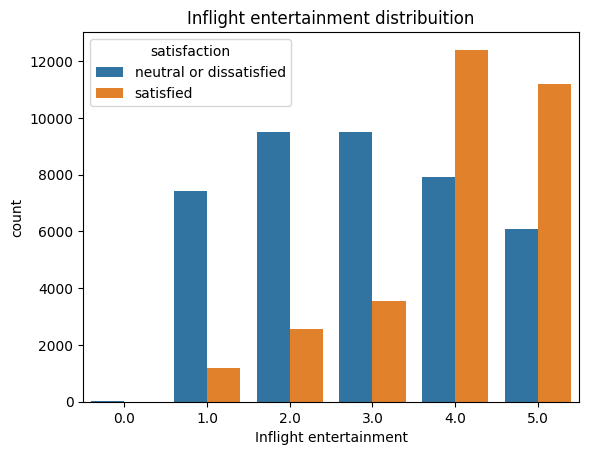

In [39]:
plot_ordinal(ordinal_cols, X_train, y_train)

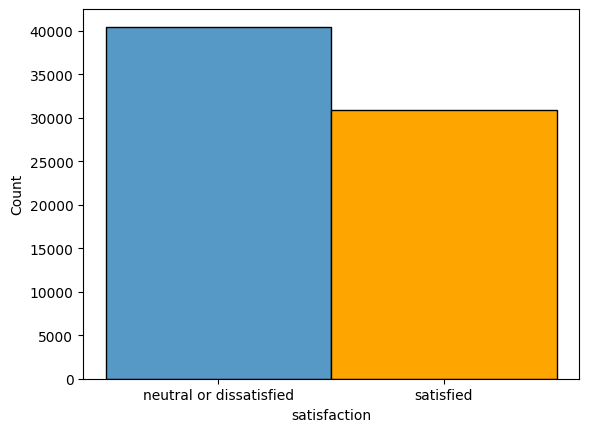

In [40]:
# visualize y_train

ax = sns.histplot(data=y_train)
ax.patches[1].set_facecolor('orange')
plt.show()

<font color='#FF6600'>Сделайте выводы по построенным графикам</font>. Полезно было бы упомянуть:
* какие признаки распределены неравномерно
* сбалансированы ли классы
* какие распределения имеют континуальные признаки

1. Тип и класс клиента, а также большинство порядковых признаков распределены неравномерно.
2. Присутствует небольшой дисбаланс классов, но не критичный.
3. Континуальные признаки, связанные с временем задержки рейса, распределены экспоненциально. Возраст пассажиров имеет нормальное распределение

In [41]:
# your answer her
# feel free to change this cell from code to markdown



(Бонус: 0.25 балла) <font color='#9933CC'>По графикам (каким, решите сами) оцените, похожи ли оказались распределения признаков при разбиении на трейн, валидацию и тест </font>

In [42]:
# your code below


(0.25 балла) Давайте <font color='#9933CC'>заменим признаки "Departure Delay in Minutes" и "Arrival Delay in Minutes" на их логарифмы.</font>

In [43]:
X_train

,gender,age,Customer Type,Type of Travel,class,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Inflight wifi service,Departure/Arrival time convenient,...,Food and drink,Online boarding,Seat comfort,Inflight entertainment,On-board service,Leg room service,Baggage handling,Checkin service,Inflight service,cleanliness
id,,,,,,,,,,,,,,,,,,,,,
2031,Female,29.0,disloyal Customer,Business travel,Business,785.0,0.0,0.0,2.0,2.0,...,4.0,2.0,3.0,4.0,4.0,3.0,5.0,4.0,5.0,4.0
11597,Female,45.0,Loyal Customer,Business travel,Business,3269.0,0.0,0.0,0.0,0.0,...,2.0,2.0,1.0,3.0,3.0,3.0,3.0,5.0,3.0,1.0
74668,Male,8.0,Loyal Customer,Personal Travel,Eco,1431.0,0.0,0.0,3.0,1.0,...,5.0,3.0,5.0,5.0,2.0,5.0,2.0,2.0,1.0,5.0
31602,Female,48.0,Loyal Customer,Personal Travel,Eco,602.0,0.0,0.0,4.0,5.0,...,2.0,5.0,4.0,4.0,4.0,4.0,2.0,3.0,4.0,3.0
51518,Female,25.0,disloyal Customer,Business travel,Eco,651.0,0.0,0.0,5.0,0.0,...,2.0,5.0,2.0,2.0,1.0,1.0,2.0,3.0,1.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
63360,Female,25.0,Loyal Customer,Personal Travel,Eco,337.0,0.0,0.0,1.0,4.0,...,4.0,1.0,4.0,4.0,5.0,4.0,4.0,4.0,4.0,4.0
29678,Male,77.0,Loyal Customer,Business travel,Eco Plus,1448.0,0.0,0.0,2.0,5.0,...,2.0,2.0,2.0,2.0,3.0,2.0,4.0,3.0,3.0,2.0
118743,Female,31.0,Loyal Customer,Personal Travel,Eco,304.0,21.0,12.0,4.0,4.0,...,1.0,4.0,5.0,1.0,5.0,3.0,5.0,4.0,5.0,1.0


In [44]:
# your code
transformer = FunctionTransformer(np.log1p)
X_train[["Departure Delay in Minutes",
         "Arrival Delay in Minutes"]] = transformer.transform(X_train[["Departure Delay in Minutes",
                                                                       "Arrival Delay in Minutes"]])

X_val[["Departure Delay in Minutes",
         "Arrival Delay in Minutes"]] = transformer.transform(X_val[["Departure Delay in Minutes",
                                                                       "Arrival Delay in Minutes"]])


Теперь заново <font color='#9933CC'>постройте графики континуальных признаков</font>

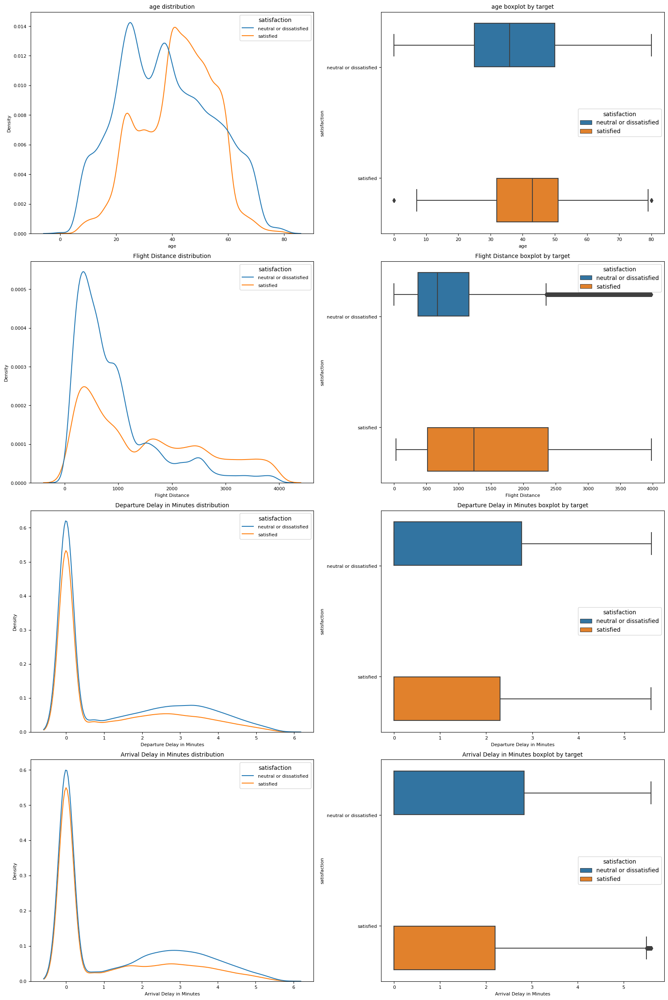

In [45]:
plot_continuous(continuous_cols, X_train, y_train)

<font color='#9933CC'>Закодируйте таргет таким образом, чтоб 'satisfied' перешел в 1, а остальные значения в 0</font>

In [46]:
# your code
y_train = y_train.map({'satisfied': 1, 'neutral or dissatisfied': 0})
y_val = y_val.map({'satisfied': 1, 'neutral or dissatisfied': 0})

(0.25 балла) <font color='#9933CC'>Отобразите попарное распределение континуальных (по договоренности) признаков. Покрасьте точки на pairplot'е в соответствии с их классом</font>. Наблюдений много, так что отрисовка графика вполне может занять несколько минут

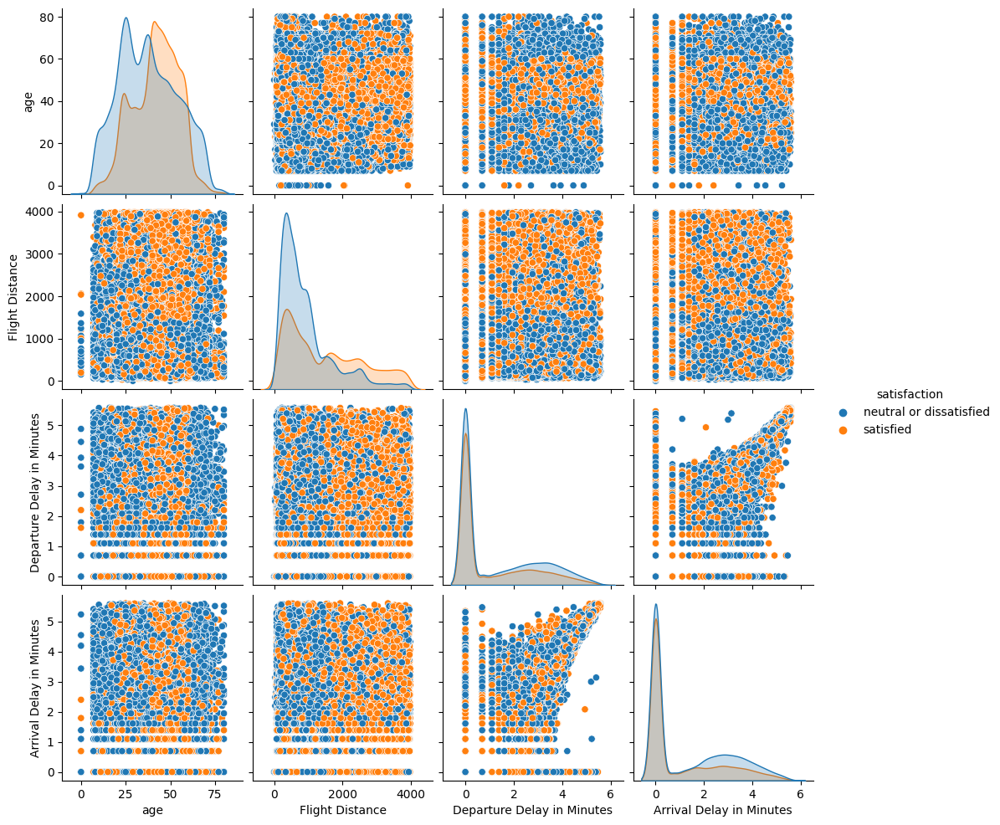

In [47]:
# your code
sns.pairplot(data=pd.concat([X_train[continuous_cols], y_train.rename('satisfaction').map({1: 'satisfied', 0: 'neutral or dissatisfied'})], axis=1), hue='satisfaction')
plt.show()

# Decision Tree (3 балла)

(0.5 балла) <font color='#9933CC'>Закодируйте категориальные признаки методом OHE</font>. Для дерева используйте гиперпараметры по умолчанию.

In [48]:
# your code below

enc = OneHotEncoder(drop='first')
encoded = enc.fit_transform(X_train[categorical_cols]).toarray()
encoded = pd.DataFrame(encoded, columns=enc.get_feature_names_out(), index=X_train.index)
X_train_cat = pd.concat([X_train, encoded], axis=1).drop(columns=categorical_cols)

print(X_train_cat.columns)
X_train_cat.head(5)

Index(['age', 'Flight Distance', 'Departure Delay in Minutes',
       'Arrival Delay in Minutes', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'cleanliness', 'gender_Male', 'Customer Type_disloyal Customer',
       'Type of Travel_Personal Travel', 'class_Eco', 'class_Eco Plus'],
      dtype='object')


,age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,...,Leg room service,Baggage handling,Checkin service,Inflight service,cleanliness,gender_Male,Customer Type_disloyal Customer,Type of Travel_Personal Travel,class_Eco,class_Eco Plus
id,,,,,,,,,,,,,,,,,,,,,
2031,29.0,785.0,0.0,0.0,2.0,2.0,2.0,4.0,4.0,2.0,...,3.0,5.0,4.0,5.0,4.0,0.0,1.0,0.0,0.0,0.0
11597,45.0,3269.0,0.0,0.0,0.0,0.0,0.0,3.0,2.0,2.0,...,3.0,3.0,5.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0
74668,8.0,1431.0,0.0,0.0,3.0,1.0,3.0,2.0,5.0,3.0,...,5.0,2.0,2.0,1.0,5.0,1.0,0.0,1.0,1.0,0.0
31602,48.0,602.0,0.0,0.0,4.0,5.0,4.0,3.0,2.0,5.0,...,4.0,2.0,3.0,4.0,3.0,0.0,0.0,1.0,1.0,0.0
51518,25.0,651.0,0.0,0.0,5.0,0.0,5.0,2.0,2.0,5.0,...,1.0,2.0,3.0,1.0,2.0,0.0,1.0,0.0,1.0,0.0


In [49]:
encoded = enc.transform(X_val[categorical_cols]).toarray()
encoded = pd.DataFrame(encoded, columns=enc.get_feature_names_out(), index=X_val.index)
X_val_cat = pd.concat([X_val, encoded], axis=1).drop(columns=categorical_cols)

print(X_val_cat.columns)
X_val_cat.head(5)

Index(['age', 'Flight Distance', 'Departure Delay in Minutes',
       'Arrival Delay in Minutes', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'cleanliness', 'gender_Male', 'Customer Type_disloyal Customer',
       'Type of Travel_Personal Travel', 'class_Eco', 'class_Eco Plus'],
      dtype='object')


,age,Flight Distance,Departure Delay in Minutes,Arrival Delay in Minutes,Inflight wifi service,Departure/Arrival time convenient,Ease of Online booking,Gate location,Food and drink,Online boarding,...,Leg room service,Baggage handling,Checkin service,Inflight service,cleanliness,gender_Male,Customer Type_disloyal Customer,Type of Travel_Personal Travel,class_Eco,class_Eco Plus
id,,,,,,,,,,,,,,,,,,,,,
62191,55.0,1065.0,0.000000,0.000000,3.0,3.0,3.0,3.0,1.0,4.0,...,4.0,4.0,2.0,4.0,3.0,1.0,0.0,0.0,0.0,0.0
71183,43.0,733.0,0.000000,0.000000,5.0,5.0,1.0,5.0,4.0,4.0,...,4.0,4.0,4.0,4.0,3.0,1.0,0.0,0.0,0.0,0.0
128411,23.0,370.0,3.970292,3.871201,2.0,1.0,2.0,3.0,2.0,2.0,...,4.0,3.0,1.0,3.0,2.0,1.0,1.0,0.0,1.0,0.0
12840,35.0,489.0,1.945910,2.564949,2.0,3.0,2.0,3.0,5.0,2.0,...,5.0,1.0,4.0,1.0,5.0,0.0,0.0,1.0,1.0,0.0
28753,24.0,1024.0,1.791759,1.945910,4.0,4.0,4.0,3.0,5.0,4.0,...,2.0,3.0,1.0,4.0,5.0,1.0,1.0,0.0,1.0,0.0


<font color='#9933CC'>Обучите дерево решений с параметрами по умолчанию на имеющихся данных.</font> Здесь и далее везде, где вас просят что-нибудь обучить, выводите `accuracy_score` для валидационной подвыборки

In [50]:
# code here

tree = DecisionTreeClassifier()

tree.fit(X_train_cat, y_train)
val_pred = tree.predict(X_val_cat)

print("*"*20)
print(f"Значение Accuracy для валидационной выборки:  {accuracy_score(y_val, val_pred):.4f}")

********************
Значение Accuracy для валидационной выборки:  0.9428


## Деревья решений. Теоретическая вставка

(0.5 балла) <font color='#9933CC'>Посчитайте bias и variance для построенного дерева.</font> Для этого проще всего вспользоваться функцией `bias_variance_decomp()` из модуля mlxtend. Используйте '0-1_loss'

In [ ]:
# change *params into what needs to be there by task condition

error_dt, bias_dt, var_dt = bias_variance_decomp(tree, X_train_cat.values,
                                                 y_train.values, X_val_cat.values,
                                                 y_val.values, loss='0-1_loss',
                                                 random_seed=123)
error_dt, bias_dt, var_dt

(0.06168382352941176, 0.04042483660130719, 0.04593480392156863)

## Возвращение к задаче

(0.5 балла) <font color='#9933CC'>Выведите на экран barplot, демонстрирующий оценки важности признаков</font>

[Text(0.5, 0, 'feature'),
 Text(0, 0.5, 'score_DT'),
 Text(0.5, 1.0, 'Feature importances')]

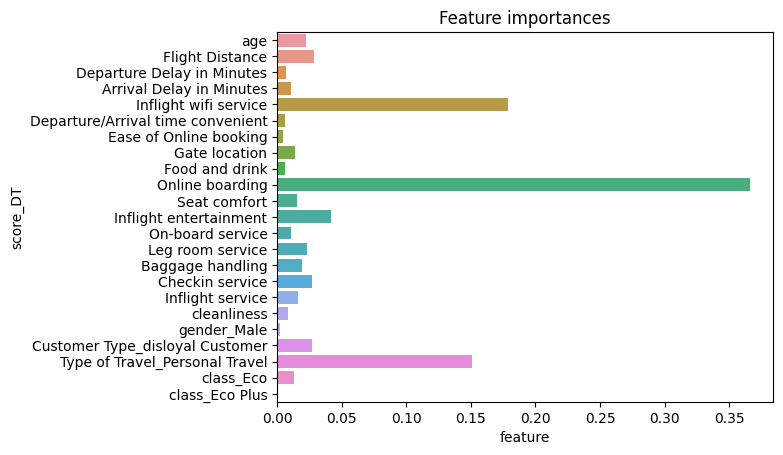

In [ ]:
# the place for your code

values = tree.feature_importances_.tolist()
keys = X_train_cat.columns.tolist()
feature_dict = { k:v for (k,v) in zip(keys, values)}

feature_df = pd.DataFrame(feature_dict.items())
ax = sns.barplot(x=1, y=0, data=feature_df, orient='h')
ax.set(xlabel = 'feature', ylabel='score_DT', title='Feature importances')

<font color='#FF6600'>Какие признаки оказались наиболее информативными?</font>

Возможность онлайн регистрации, Wi-fi сервис во время полета, Тип поездки (рабочая/личная)

<font color='#9933CC'>Какой глубины получилось дерево? Сколько в нем листьев?</font>

In [ ]:
print(f'Полученное дерево имеет глубину {tree.get_depth()} и {tree.get_n_leaves()} листьев.')

Полученное дерево имеет глубину 29 и 2063 листьев.


<font color='#9933CC'>Постройте дерево глубины 5, используя только 2 наиболее информативных признака для предыдущего построенного дерева</font>. <font color='#FF6600'>Насколько упало качество на тесте?</font>

In [ ]:
X_train_cat.columns

Index(['age', 'Flight Distance', 'Departure Delay in Minutes',
       'Arrival Delay in Minutes', 'Inflight wifi service',
       'Departure/Arrival time convenient', 'Ease of Online booking',
       'Gate location', 'Food and drink', 'Online boarding', 'Seat comfort',
       'Inflight entertainment', 'On-board service', 'Leg room service',
       'Baggage handling', 'Checkin service', 'Inflight service',
       'cleanliness', 'gender_Male', 'Customer Type_disloyal Customer',
       'Type of Travel_Personal Travel', 'class_Eco', 'class_Eco Plus'],
      dtype='object')

In [ ]:
# the place for your solution

tree_short = DecisionTreeClassifier(max_depth=5, random_state=42)

tree_short.fit(X_train_cat[['Inflight wifi service', 'Online boarding']], y_train)
val_short_pred = tree_short.predict(X_val_cat[['Inflight wifi service', 'Online boarding']])

print("*"*20)
print(f"Значение Accuracy для валидационной выборки:  {accuracy_score(y_val, val_short_pred):.4f}")

********************
Значение Accuracy для валидационной выборки:  0.8248


Качество упало значительно, но далеко не так сильно, как я ожидал

(0.25 балла) <font color='#9933CC'>С помощью graphviz постройте получившееся дерево решений</font>. <font color='#FF6600'>Почему предикаты в нем не целые, а кратны 1/2?</font>

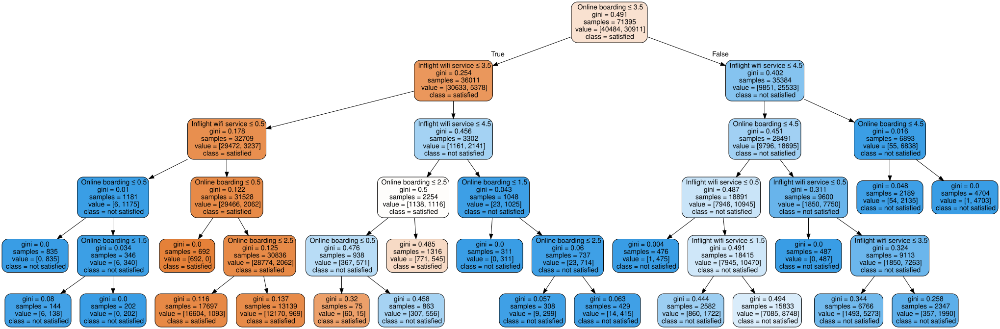

In [ ]:
# feel free to google
import graphviz

# https://stackoverflow.com/questions/42621190/display-this-decision-tree-with-graphviz
dot_data = export_graphviz(tree_short,
                  feature_names=tree_short.feature_names_in_.tolist(),
                  class_names=['satisfied','not satisfied'],
                  filled=True, rounded=True,
                  special_characters=True,
                   out_file=None,
                           )
graph = graphviz.Source(dot_data)
graph

Предикаты, кратные 1/2 являются лучшими в плане разделения множества объектов на две части. При проходе через узел дерева с данным предикатом объекты будут отправлены в правое поддерево, если значение j-го признака у них меньше либо равно t, и в левое — если больше.

Картинка ниже взята [отсюда](https://education.yandex.ru/handbook/ml/article/reshayushchiye-derevya)


<img src='https://yastatic.net/s3/ml-handbook/admin/3_7_f51986c1ae.png'>

In [ ]:
graph.format = "png"
graph.render("wow")

'wow.png'

<font color='#9933CC'>Теперь постройте дерево той же глубины 5 для 2-х наиболее информативных континуальных (по договорённости) признаков</font>

In [ ]:
# your code below

tree_con = DecisionTreeClassifier(max_depth=5, random_state=42)

tree_con.fit(X_train_cat[['age', 'Flight Distance']], y_train)
val_con_pred = tree_con.predict(X_val_cat[['age', 'Flight Distance']])

print("*"*20)
print(f"Значение Accuracy для валидационной выборки:  {accuracy_score(y_val, val_con_pred):.4f}")

********************
Значение Accuracy для валидационной выборки:  0.6837


(0.25 балла) <font color='#9933CC'>Отобразите его функцией `plot_tree()` из sklearn</font>. <font color='#FF6600'>Симметричным ли получилось дерево? Это хорошо или плохо?</font>

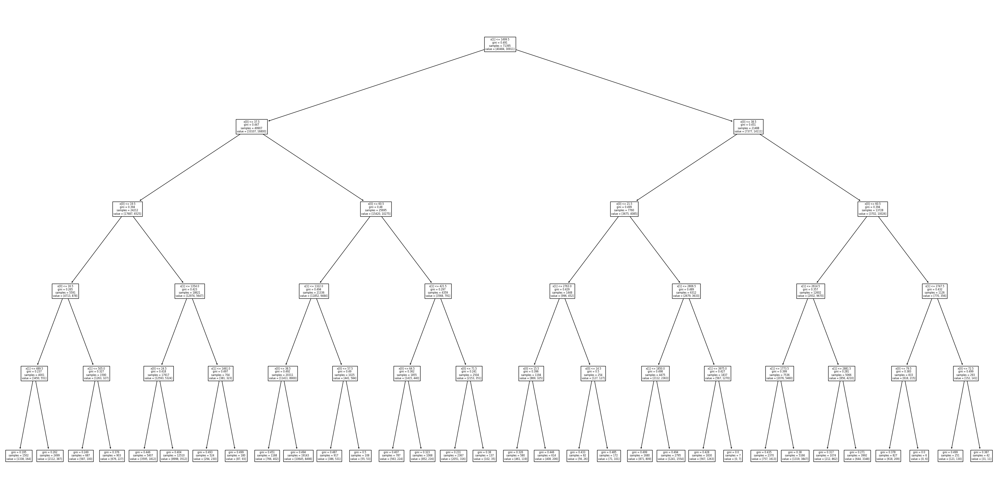

In [ ]:
# another place to code a few lines

fig, ax = plt.subplots()
fig.set_size_inches(40, 20)
ax = plot_tree(tree_con)
plt.show()

Дерево получилось не симметричным, так как оно имеет разные предикаты на каждом уровне.


[Тут](https://github.com/catboost/tutorials/blob/master/model_analysis/visualize_decision_trees_tutorial.ipynb) написано, что в Catboost используются симметричные деревья, и для них одним из требований является как раз одинаковые придикаты на каждом уровне дерева.

Симметричные деревья имеют явное преимущество, когда дело касается инференса. Еще преимущества:
- Простая схема подгонки
- Эффективность реализации на ЦП
- Возможность очень быстрого применения модели

Однако симметричные деревья - это не всегда хорошо.

(0.5 балла) <font color='#9933CC'>Используя функцию `plot_decision_regions()` из `mlxtend`, отобразите разделяющую поверхность получившегося дерева.</font> Отметьте на графике только первые 100 объектов обучающей выборки

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


<Axes: >

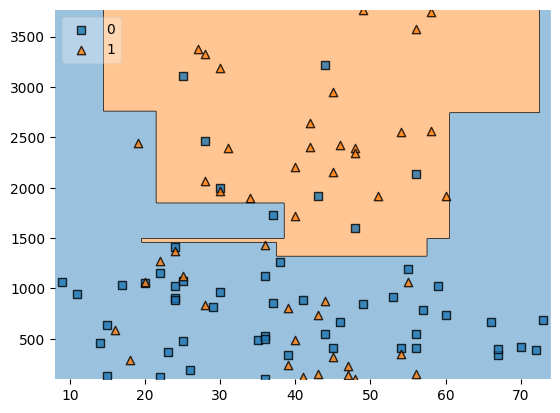

In [ ]:
# your line of code
plot_decision_regions(X_val_cat[['age', 'Flight Distance']].values[:100], y_val.values[:100], clf=tree_con, legend=2)

## Деревья решений. Теоретическая вставка 2

Из лекций вам должно быть известно, что деревья решений неустойчивы даже к небольшим изменениям в обучающей выборке. Попробуем показать это

X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names
X does not have valid feature names, but DecisionTreeClassifier was fitted with feature names


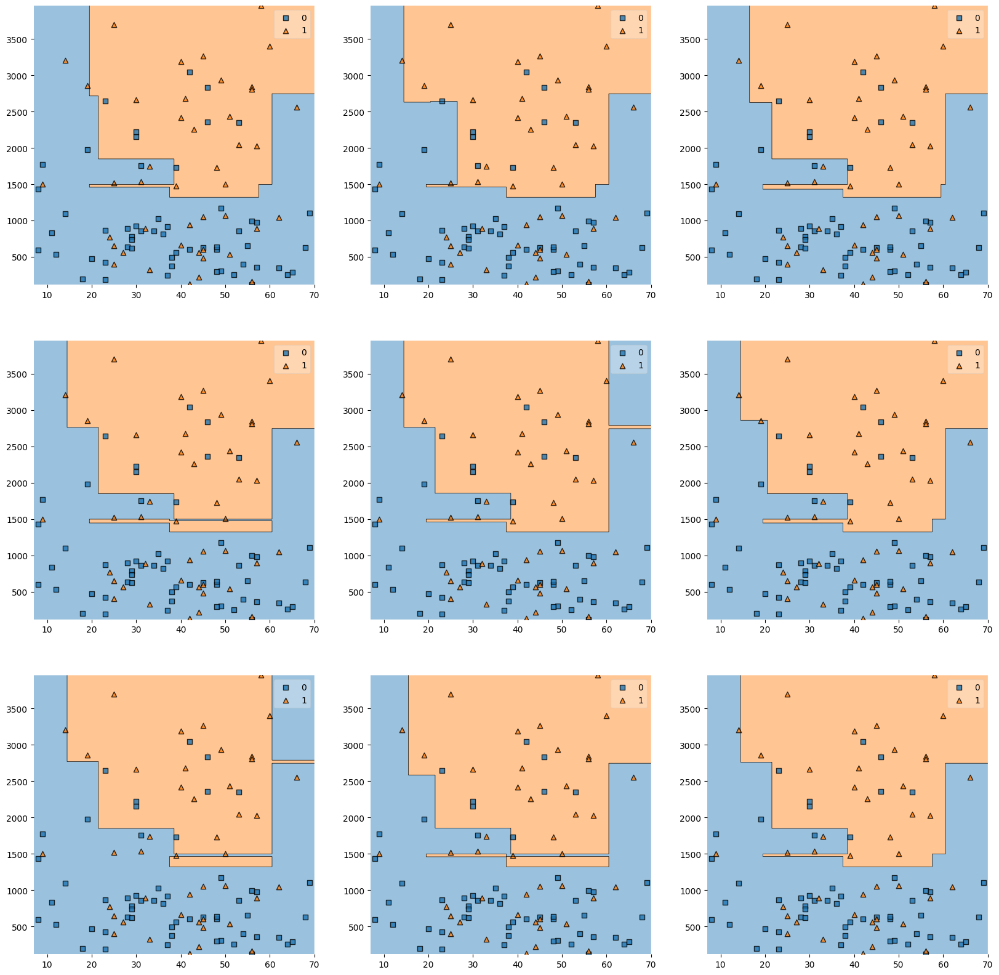

In [ ]:
# change X_train_example to your equivalent

fig, ax = plt.subplots(3, 3, figsize=(20, 20))

for row in range(3):
    for col in range(3):
        inds = np.random.choice(X_train_cat[['age', 'Flight Distance']].index, size=X_train_cat[['age', 'Flight Distance']].shape[0] - 5000, replace=False) # нагляднее брать не на 1к, а на 5к меньше объектов, а то почти не изменяется разделяющая поверхность

        tree_exp = DecisionTreeClassifier(max_depth=5, random_state=42)
        tree_exp.fit(X_train_cat[['age', 'Flight Distance']].loc[inds, :], y_train[inds])

        plot_decision_regions(clf=tree_exp, X=np.array(X_train_cat[['age', 'Flight Distance']].iloc[:100, :]), y=np.array(y_train[:100]), ax=ax[row][col])

Мы убирали из трейна (а в нем ~80к наблюдений) всего по тысяче случайных объектов!

Помимо своей неусточивости деревья решений "славны" ещё и склонностью к переобучению. Посмотрим, можно ли увидеть это свойство на имеющихся у нас данных. Для этого будем обучать алгоритм DT на всем трейне с разной глубиной дерева и считать accuracy для теста

In [ ]:
# change X_train_enc into your ohe-encoded train set

%%time
depths = [2, 3, 5, 10, 15, 20, 25, 32, 50, 64, 75, 100]

accuracies_train = []
accuracies_test = []
for max_depth in depths:
    DT = DecisionTreeClassifier(max_depth=max_depth, random_state=42)
    DT.fit(X_train_cat, y_train)
    y_predicted_train = DT.predict(X_train_cat)
    y_predicted_val = DT.predict(X_val_cat)
    accuracies_train.append(accuracy_score(y_train, y_predicted_train))
    accuracies_test.append(accuracy_score(y_val, y_predicted_val))

CPU times: user 5.77 s, sys: 6.77 ms, total: 5.78 s
Wall time: 5.83 s


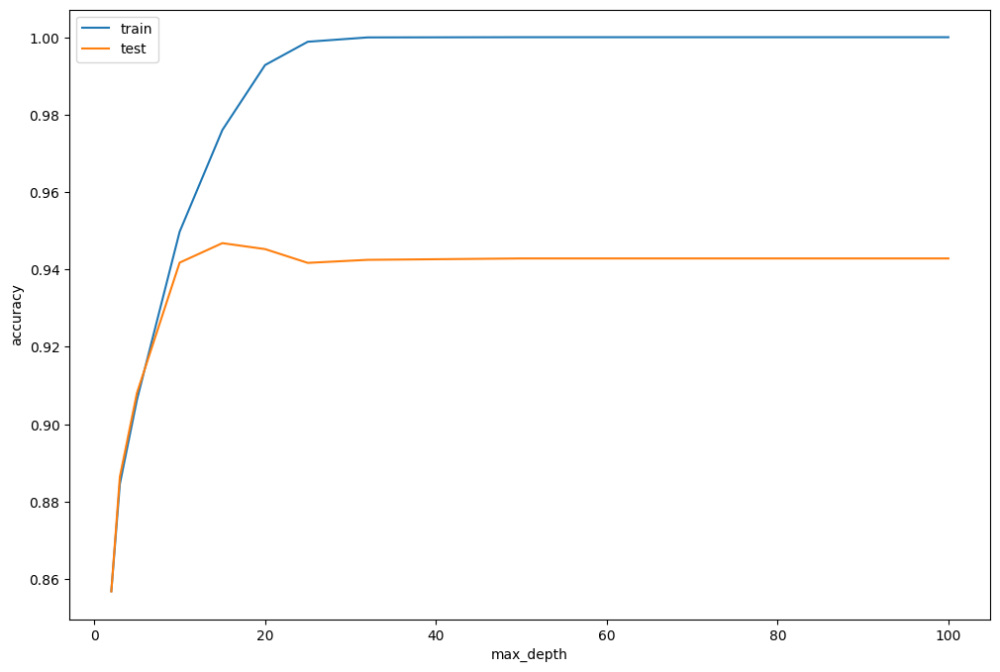

In [ ]:
plt.figure(figsize=(12, 8))
plt.plot(depths, accuracies_train, depths, accuracies_test)
plt.legend(['train', 'test'])
plt.ylabel('accuracy')
plt.xlabel('max_depth')
plt.show()

Нам повезло выйти на ассимптоту на тесте. Однако так бывает далеко не всегда. Так что подбирать гипрепараметры для деревьев решений стоит осторожно

## Возвращение к задаче

(0.5 балла) <font color='#9933CC'>На кроссвалидации подберите оптимальные гиперпараметры для дерева решений</font> *(по данным со всеми признаками -- не на модельном примере из теоретической вставки)*. <font color='#FF6600'>Удалось ли улучшить качество предсказаний подбором гиперпараметров?</font>

In [ ]:
# you know what to do

tree = DecisionTreeClassifier(random_state=17)

tree_params = {'criterion': ['gini', 'entropy', 'log_loss'],
               'min_samples_split':np.arange(1,10,1),
               'max_depth': np.arange(5,105,10),
               'max_features': np.arange(1,23,1),
               }
               #'max_leaf_nodes': np.arange(2000,3000,100),
tree_grid = GridSearchCV(tree, tree_params,
cv=5, n_jobs=-1,
verbose=True)

tree_grid.fit(X_train_cat, y_train)

Fitting 5 folds for each of 5940 candidates, totalling 29700 fits



3300 fits failed out of a total of 29700.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
3300 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py", line 889, in fit
    super().fit(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/tree/_classes.py", line 177, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sk

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(max_depth=5, random_state=17),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy', 'log_loss'],
                         'max_depth': array([ 5, 15, 25, 35, 45, 55, 65, 75, 85, 95]),
                         'max_features': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22]),
                         'min_samples_split': array([1, 2, 3, 4, 5, 6, 7, 8, 9])},
             verbose=True)

In [ ]:
print(f'Лучший score: {tree_grid.best_score_}')
print(f'Лучшие параметры: {tree_grid.best_params_}')

Лучший score: 0.950122557602073
Лучшие параметры: {'criterion': 'entropy', 'max_depth': 15, 'max_features': 21, 'min_samples_split': 8}


In [ ]:
X_val_pred = tree_grid.best_estimator_.predict(X_val_cat)

accuracy_score(y_val, X_val_pred)

0.9514705882352941

Да, удалось немного улучшить качество предсказаний как тренировочной, так и на валидационной выборке

<font color='#9933CC'> Сохраните лучшее дерево в pickle </font>

*Мы просим это сделать, чтобы вы в случае чего не тратили время на переобучение, а могли банально подгрузить из файла*

In [ ]:
data = {
     'best_model': tree_grid.best_estimator_,
     'params_model': tree_grid.best_params_,
 }

with open('DT.pkl', 'wb') as f:
    pickle.dump(data, f)

# Random Forest (4 балла)

<font color='#9933CC'>Обучите случайный лес с параметрами по умолчанию</font>

In [ ]:
# -__-

r_forest = RandomForestClassifier()

r_forest.fit(X_train_cat, y_train)

for_pred = r_forest.predict(X_val_cat)

print(f'Accuracy score: {accuracy_score(y_val, for_pred)}')

Accuracy score: 0.9605882352941176


(0.75 балла) <font color='#9933CC'>Выведите калибровочную кривую для полученного ансамбля</font>

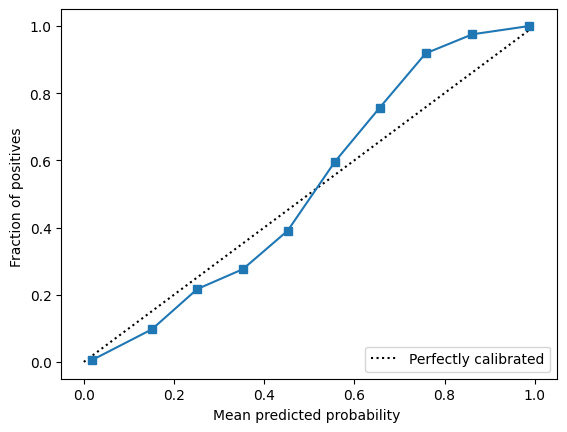

In [ ]:
# some lines of your code
from sklearn.calibration import calibration_curve

y_prob = r_forest.predict_proba(X_val_cat)[:, 1]
prob_true, prob_pred = calibration_curve(y_val, y_prob, n_bins=10)
disp = CalibrationDisplay(prob_true, prob_pred, y_prob)
disp.plot()

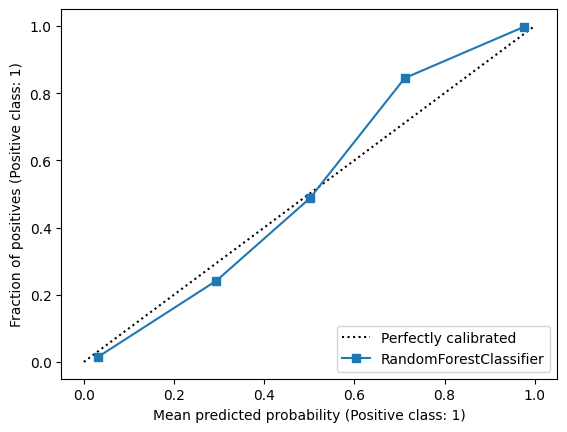

In [ ]:
disp = CalibrationDisplay.from_estimator(r_forest, X_val_cat, y_val)
plt.show()

Похоже, мы немного недооцениваем высокие вероятности

<img src='https://habrastorage.org/r/w1560/getpro/habr/upload_files/510/4e0/63b/5104e063b62bd0ac6b87da44a3034aa5.png'>

Изображение взято из статьи ["predict_proba в Python не прогнозирует вероятности (и как с этим бороться)"](https://habr.com/ru/company/otus/blog/573924/) с Хабра

<font color='#FF6600'>Вспомните (или выведите), корректно ли деревья предсказывают вероятности?</font>

В случае классификации деревья предсказывают вероятности $P_n$ класса как долю объектов этого $n$-го класса в каждом листе, или это может быть класс, к которому относится большинство объектов в данном листе.

Для регрессии это может быть среднее значение, медиана или другая функция от целевых переменных
объектов в листе.

Так что в целом да, деревья корректно предсказывают вероятности. Однако такие алгоритмы, как ускоренные деревья решений, имеют тенденцию отклонять прогнозируемые вероятности от 0 и 1. Это написано в статье выше :)

<font color='#9933CC'>Обучите логистическую регрессию с параметрами по умолчанию и отобразите её калибровочную кривую</font>

UPD: не с параметрами по умолчанию, а так, чтоб сошлась

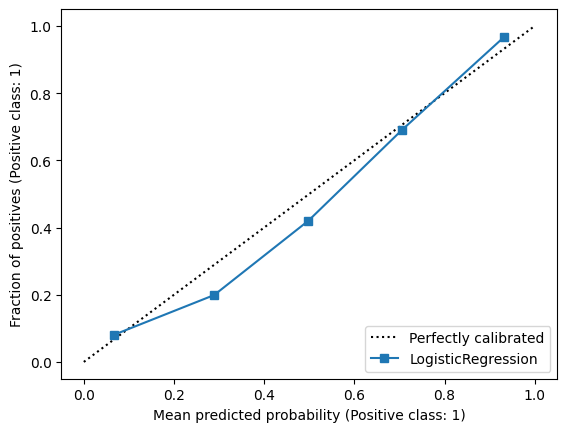

In [ ]:
# --____--

model = LogisticRegression(max_iter=500, C=0.3, solver='newton-cg')

model.fit(X_train_cat,y_train)
model.predict(X_val_cat)

disp = CalibrationDisplay.from_estimator(model, X_val_cat, y_val)
plt.show()

Мы немного переоцениваем предсказанные низкие вероятности

<font color='#FF6600'>Покажите, почему считается, что логистическая регрессия корректно предсказывает вероятности?</font>

In [ ]:
# maths needed



- Рассмотрим точку $x$ пространства объектов. Пусть в ней имеется распределение на ответах $P(y=+1|x)$. Допустим, алгоритм $b(x)$ возвращает числа из отрезка $[0,1]$.
Наша задача - выбрать для этого алгоритма такую процедуур обучения, что в точке $x$ ему будет оптимально выдавать число $P(y=+1|x)$. Если в выборке объект $x$ встечается $n$ раз, с ответами ${y_1, y_2,...,y_n}$, то получаем следующее требование:

$$argmin{1 \over n} \sum_{i=1}^n L(y_i,b) \thickapprox P(y=+1|x)$$

При стремлении к бесконечности получим, что функционал ошибки стремится к матожиданию ошибки:

$$argmin𝗘[L(y,b|x)] = P(y=+1|x)$$

Это и есть критерий, которому должен удовлетворять классификатор, чтобы его выход можно было расценивать как оценку вероятности класса.

- Теперь рассмотрим случай логистической регресии:
  
  Для логистической регрессии оптимальный параметр находится минимизацией кросс-энтропии:

$$ L(w) =  - {1 \over \ell} \sum_{i=1}^\ell \left[ {y_i \cdot log P(y_i = 1 \, | \, x_i,w) + (1-y_i) \cdot log (1-P(y_i = 1 \, | \, x_i,w))}\right] $$

Чтобы минимизировать функционал ошибки, нужно найти вектор веов $w$, при котором градиент равен нулю.

$$ \nabla_w L = {1 \over \ell} \sum_{i=1}^\ell (P_i - y_i) \cdot X_i^\mathrm{T} = {1 \over \ell} \sum_{i=1}^\ell ((y_i = 1 \, | \, x_i,w) - y_i) \cdot x_i = \sum_{i=1}^\ell y_i \cdot x_i$$

Из равенства выше следует:

$$ \sum_{i=1}^\ell (y_i = 1 \, | \, x_i,w) = \sum_{i=1}^\ell y_i$$


Это означает, что логистическая регрессия хорошо откалибрована (в теории, на практике в популярных библиотеках не особо) и предсказывает настоящие вероятности.

Ссылки на источники:
[раз](https://github.com/esokolov/ml-course-hse/blob/master/2021-fall/seminars/sem06-probs-quantile.pdf), [два](https://education.yandex.ru/handbook/ml/article/kak-ocenivat-veroyatnosti#no-pochemu-zhe-vse-tverdyat-chto-logisticheskaya-regressiya-horosho-kalibrovana), [три ](https://stats.stackexchange.com/questions/208867/why-does-logistic-regression-produce-well-calibrated-models/409756#409756)

(0.75 балла) <font color='#9933CC'>Предлагаем вам попробовать откалибровать вероятности обученного случайного леса</font>. Для этого воспользуйтесь логистической и изотонической регрессиями. <font color='#FF6600'>Интерпретируйте полученные результаты</font>

В этом задании по идее для калибровки нужно использовать другие данные, а не те, на которых мы фиттимся или будем потом оценивать качество. Но тогда получаются графики, которые не совпадают с эталонными (оствленными преподавателем в выводе ячеек)

In [54]:
X_val_train, X_val_test, y_val_train, y_val_test = train_test_split(X_val_cat, y_val, test_size=0.3)

r_forest_calib = RandomForestClassifier()

r_forest_calib.fit(X_train_cat, y_train)
y_prob = r_forest_calib.predict_proba(X_val_train)[:, 1]

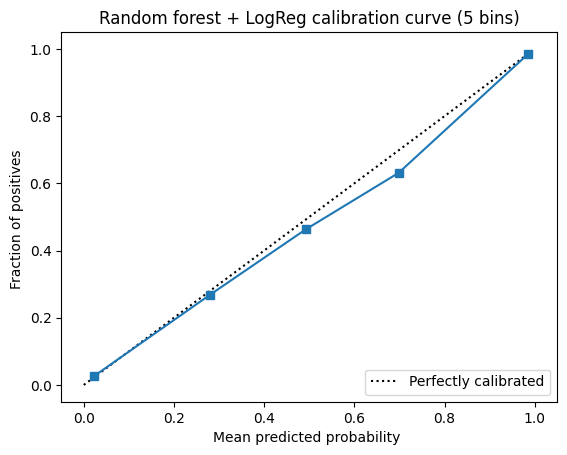

In [63]:
# yet another code cell for logreg
from sklearn.calibration import calibration_curve

#y_prob = r_forest.predict_proba(X_val_cat)[:, 1]
log_reg = LogisticRegression().fit(y_prob.reshape(-1, 1), y_val_train)
proba_test_forest_logreg = log_reg.predict_proba(r_forest_calib.predict_proba(X_val_test)[:, 1].reshape(-1, 1))[:, 1]

prob_true, prob_pred = calibration_curve(y_val_test, proba_test_forest_logreg, n_bins=5)
CalibrationDisplay(prob_true, prob_pred, proba_test_forest_logreg).plot()
plt.title("Random forest + LogReg calibration curve (5 bins)")
plt.show()

Калибровка с помощью логистической регрессии переоценивает высокие вероятности.

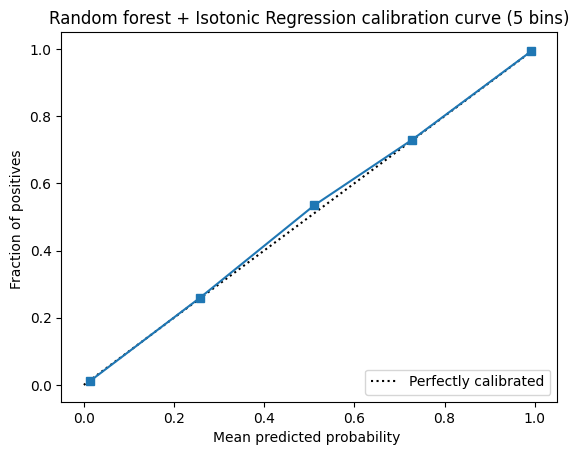

In [67]:
# yet another code cell for isoreg

y_prob = r_forest_calib.predict_proba(X_val_train)[:, 1]
iso_reg = IsotonicRegression(y_min = 0, y_max = 1, out_of_bounds = 'clip').fit(y_prob, y_val_train)
proba_test_forest_isoreg = iso_reg.predict(r_forest_calib.predict_proba(X_val_test)[:, 1])

prob_true, prob_pred = calibration_curve(y_val_test, proba_test_forest_isoreg, n_bins=5)
CalibrationDisplay(prob_true, prob_pred, proba_test_forest_isoreg).plot()
plt.title("Random forest + Isotonic Regression calibration curve (5 bins)")
plt.show()

Калибровка с помощью изотонической регрессии помогает получить практически идеально откалиброванную модель -- она немного недооценивает среднеи вероятности.

<font color='#FF6600'>Опишите другие возвожные подходы к калбировке вероятностей (со ссылками на источники)</font>

In [ ]:
# feel free to change this cell into markdown



- [Гистограммная калибровка](https://education.yandex.ru/handbook/ml/article/kak-ocenivat-veroyatnosti#no-pochemu-zhe-vse-tverdyat-chto-logisticheskaya-regressiya-horosho-kalibrovana)

Мы разбиваем отрезок на бины (одинаковой ширины или равномощные) и хотим на каждом из них предсказывать всегда одну и ту же вероятность: $ϴ_j$ , если $q(x_i) \in B_j$.
Вероятности подбираются так, чтобы они как можно лучше приближали средние метки классов на соответствующих бинах; иными словами, мы решаем задачу:

$$\sum_{j=1}^k | \frac{\sum_{i=1}^N I (q(x_i) \in B_j)y_i}{|B_j|} - ϴ_j  | \to min$$

- [Калибровка Платта](https://education.yandex.ru/handbook/ml/article/kak-ocenivat-veroyatnosti#no-pochemu-zhe-vse-tverdyat-chto-logisticheskaya-regressiya-horosho-kalibrovana)

Представляет собой по сути применение сигмоиды поверх другой модели (то есть самый наивный способ получения ''вероятностей''). Более точно, если $q(x_i)$ – предсказанная вероятность, то мы полагаем:


$$ P(y_i=1|x_i) =  \sigma(aq(x_i)+b) = \dfrac{1}{1 + \exp(-(aq(x_i)+b))}$$


где $a$ и $b$ подбираются методом максимального правдоподобия на отложенной выборке.

(1 балл) <font color='#9933CC'>Посчитайте разброс и смещение полученного случайного леса (до калибровки).</font><font color='#FF6600'>Оличаются ли они от полученных для дерева решений? Соответствуют ли полученные на реальных данных отличия (//совпадения) от тех, что должны быть в теории? По каким причинам?</font>

In [ ]:
# one more place for your code
error_dt, bias_dt, var_dt = bias_variance_decomp(r_forest, X_train_cat.values,
                                                 y_train.values, X_val_cat.values,
                                                 y_val.values, loss='0-1_loss',
                                                 random_seed=123)

print(f'Average expected loss: {error_dt}')
print(f'Average bias: {bias_dt}')
print(f'Average variance: {var_dt}')

Average expected loss: 0.04075196078431373
Average bias: 0.0392483660130719
Average variance: 0.009161764705882352


Да, полученные разброс и смещение отличаются от таковых при расчете для дерева решений. Разброс сильно упал, смещение осталось примерно на том же уровне.

Из теории:

Неглубокое решающее дерево имеет высокое смещение и низкий разброс, как в нашем случае, так как оно не 'запоминает' обучающую выборку и при смене выборке результат меняется не сильно. В случае глубокого решающего дерева имеем наоборот высокое значение разброса и низкое смещения, так как в этом случае дерево 'запоминает' обучающую выборку и при ее смене результат модели меняется сильно.

Случайный лес выдал ожидаемые результаты на реальных данных, разброс снизился по причине усреднения результатов множества решающих деревьев с разными разбиенями, а смещение осталось на том же уровне, что и у одного дерева.

<font color='#9933CC'>Вычислите разложение ошибки для логистической регрессии (ванильной, не той, что использовали для калибровки).</font> <font color='#FF6600'>Сравните полученные результаты с предыдущими. Объясните природу этих результатов</font>

In [ ]:
# (•_•)
model = LogisticRegression(max_iter=500, solver='newton-cg', random_state=123)

avg_expected_loss, avg_bias, avg_var = bias_variance_decomp(model, X_train_cat.values,
                                                            y_train.values, X_val_cat.values,
                                                            y_val.values, loss='mse', random_seed=123)

print(f'Average expected loss: {avg_expected_loss}')
print(f'Average bias: {avg_bias}')
print(f'Average variance: {avg_var}')

The line search algorithm did not converge
Line Search failed


Average expected loss: 0.12410473856209149
Average bias: 0.12120970506535948
Average variance: 0.002895033496732025


Для логистической регрессии получаем более высокое значение смещения, а разброс получился ниже, чем у одного дерева и леса.

Высокое смещение и низкий разброс характерны для простых семейств моделей (линейных классификаторов, например). Для примера, можно представить себе гиперплоскость, которой мы пытаемся разделить объекты на два класса. Разброс будет небольшим, так как гиперплоскость будет мало меняться при смене выборки, а смещение будет высоким, так как сложные зависимости в данных чаще всего трудно описать гиперплоскостью.

Низкое смещение и высокий разброс характеры для сложных семейств моделей (например, деревьев).
В этой ситуации, напротив, у нас есть все небоходимое, чтобы сильнее подстроиться под данные, хорошо их описать и получить низкое смещение (и легко переобучиться). Однако это оборачивается высокой чувствительностью к изменениям в выборке, следовательно, высокий разброс.

(1 балл) <font color='#9933CC'>Попробуйте подобрать оптимальные гиперпараметры, используя `RandomizedSearchCV`</font>. Хотя бы один из гиперпараметров перебирайте из распределения (например, `uniform` из `scipy.stats`)

In [ ]:
# your code here

from scipy.stats import uniform

r_forest_cv = RandomForestClassifier(random_state=17)

tree_params = {
               'criterion': ['gini', 'entropy', 'log_loss'],
               'n_estimators':np.arange(100,1000,100),
               'max_depth': np.arange(35,125,10),
               'max_features': ['auto', 'sqrt'],
               'min_weight_fraction_leaf': uniform(0,1),
               'min_samples_leaf': np.arange(10,100,10)
               }

forest_grid = RandomizedSearchCV(r_forest_cv, tree_params,
cv=5, n_jobs=-1,
verbose=False)

forest_grid.fit(X_train_cat, y_train)


20 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
5 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py", line 340, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils/_param_validation.py", line 97, in validate_parameter_constraints
    raise InvalidParameterError(
skl

RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=17),
                   n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy',
                                                      'log_loss'],
                                        'max_depth': array([ 35,  45,  55,  65,  75,  85,  95, 105, 115]),
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': array([10, 20, 30, 40, 50, 60, 70, 80, 90]),
                                        'min_weight_fraction_leaf': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7c6acb6cd720>,
                                        'n_estimators': array([100, 200, 300, 400, 500, 600, 700, 800, 900])},
                   verbose=False)

In [ ]:
forest_grid.best_estimator_

RandomForestClassifier(max_depth=35, min_samples_leaf=30,
                       min_weight_fraction_leaf=0.004676635612694602,
                       n_estimators=800, random_state=17)

In [ ]:
forest_grid.best_score_

0.9196862525386932

In [ ]:
random_for_pred = forest_grid.predict(X_val_cat)

print(f'Accuracy score: {accuracy_score(y_val, random_for_pred)}')

Accuracy score: 0.9190196078431373


Получилось хуже, чем дефолтный лес :(

Пытался брать другие параметры и другие границы, этот результат лучший

## Случайный лес. Вставка теории

На модельном примере посмотрим, склонен ли случайный лес к переобучению с ростом числа деревьев в композиции.

Возьмем 4 полезных признака из одного из предыдщущих заданий, напоминающих теорию

In [ ]:
# change X_train_enc into you equivalent

cols_for_RF = ['age', 'Flight Distance', 'Online boarding', 'Inflight wifi service']
X_train_RF = X_train_cat[cols_for_RF]
# а тест нам не понадобится, ведь можно получить OOB-estimate ошибки

clf = RandomForestClassifier(warm_start=True, oob_score=True, random_state=42)
errors = []

for n_estimators in range(1, 251, 5):
    clf.set_params(n_estimators=n_estimators)
    clf.fit(X_train_RF, y_train)

    errors.append(1 - clf.oob_score_)

Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.
Some inputs do not have OOB scores. This probably means too few trees were used to compute any reliable OOB estimates.


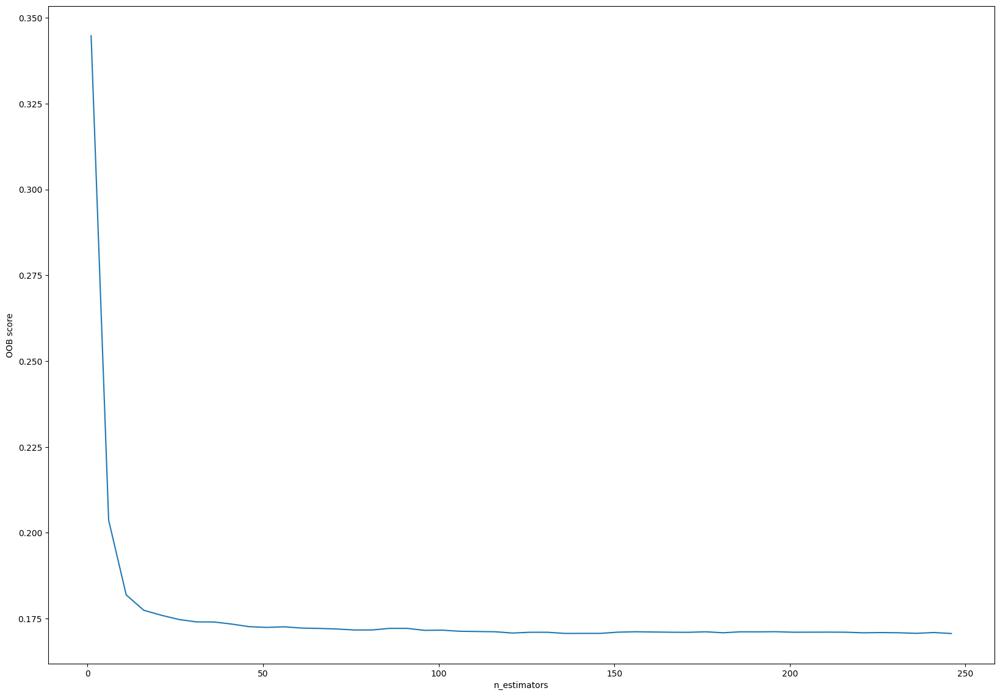

In [ ]:
plt.figure(figsize=(20, 14))
plt.plot(range(1, 251, 5), errors)

plt.xlabel('n_estimators')
plt.ylabel('OOB score')
plt.show()

> **Дисклеймер**: отсутствие переобучения с ростом числа деревьев вовсе не означает, что сама модель случайного леса не может быть переобучена. Базовые деревья такой композиции могут переобучаться. Значит, и вся композиция вполне способна оказаться переобученной

## Возвращение к задаче

<font color='#9933CC'>Отобразите `feature_importances_` вашего лучшего случайного леса</font>

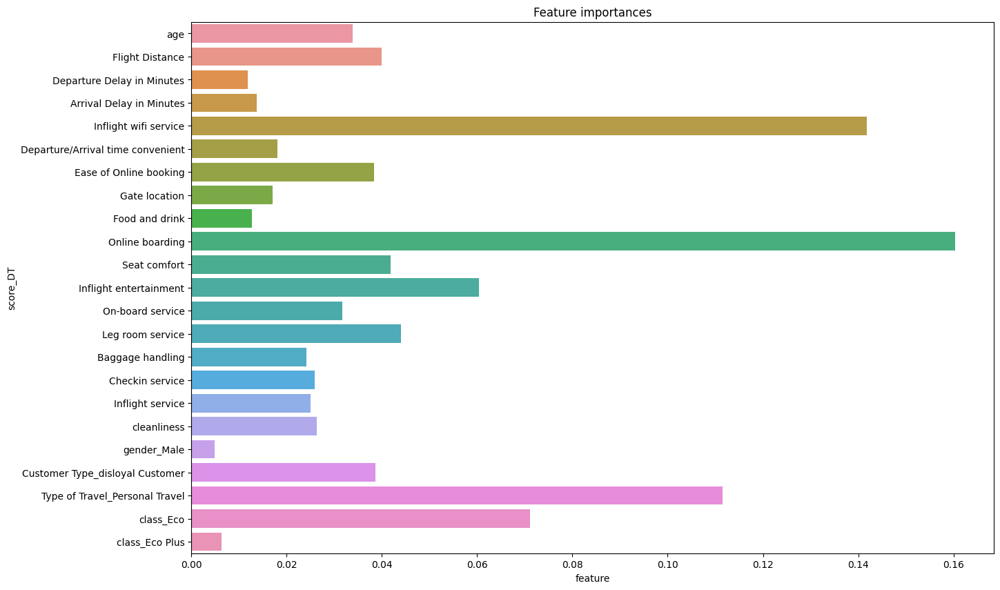

In [ ]:
# (•_•)
values = r_forest.feature_importances_.tolist()
keys = X_train_cat.columns.tolist()
feature_dict = { k:v for (k,v) in zip(keys, values)}

plt.figure(figsize=(15, 10))
feature_df = pd.DataFrame(feature_dict.items())
ax = sns.barplot(x=1, y=0, data=feature_df, orient='h')
ax.set(xlabel = 'feature', ylabel='score_DT', title='Feature importances')
plt.show()

(0.5 балла) <font color='#9933CC'>Сравните важности признаков для дерева решений и для случайного леса. Постройте диаграмму</font>

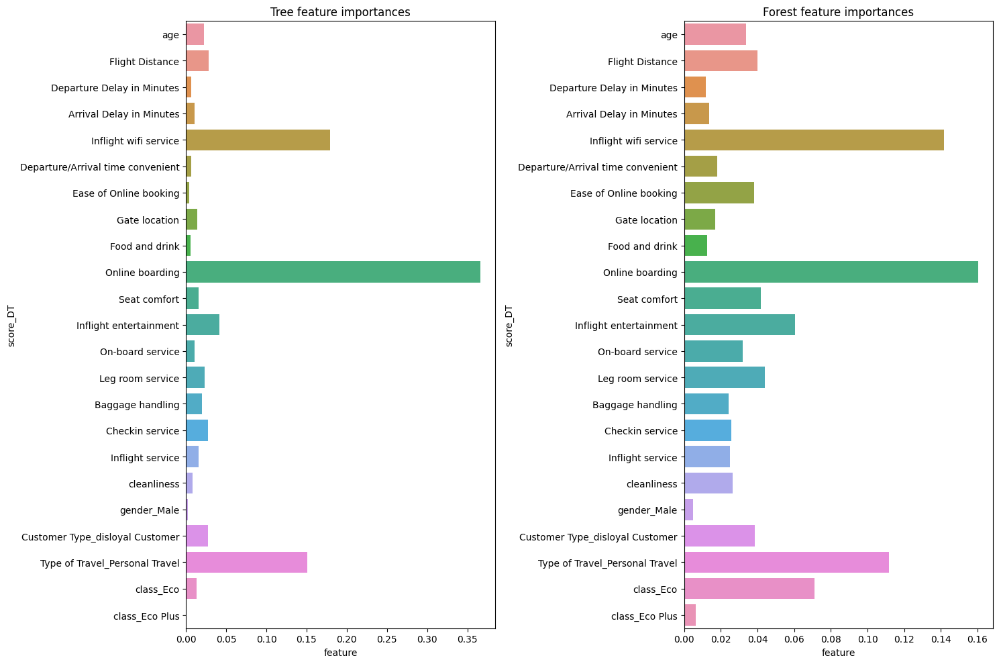

In [ ]:
# -__-

values_tree = tree.feature_importances_.tolist()
keys_tree = X_train_cat.columns.tolist()
feature_dict_tree = { k:v for (k,v) in zip(keys_tree, values_tree)}
tree_df = pd.DataFrame(feature_dict_tree.items())

values_forest = r_forest.feature_importances_.tolist()
keys_forest = X_train_cat.columns.tolist()
feature_dict_forest = { k:v for (k,v) in zip(keys_forest, values_forest)}
forest_df = pd.DataFrame(feature_dict_forest.items())

plt.figure(figsize=(15, 10))
plt.subplot(1, 2, 1)
ax = sns.barplot(x=1, y=0, data=tree_df, orient='h')
ax.set(xlabel = 'feature', ylabel='score_DT', title='Tree feature importances')

plt.subplot(1, 2, 2)
ax = sns.barplot(x=1, y=0, data=forest_df, orient='h')
ax.set(xlabel = 'feature', ylabel='score_DT', title='Forest feature importances')

plt.tight_layout()
plt.show()

Бонус (0.5 балла) <font color='#9933CC'>Интерпретируйте важности признаков с помощью SHAP</font>. Для подсчета используйте 1000 случайных объектов, иначе не дождетесь за приемлемое время

[Статья "Интерпретация моделей и диагностика сдвига данных: LIME, SHAP и Shapley Flow"](https://habr.com/ru/company/ods/blog/599573/) из блога ods.ai на Хабре

In [ ]:
# (•_•)
explainer = shap.Explainer(r_forest, X_train_cat)
shap_values = explainer(X_train_cat[:1000])

100%|===================| 1995/2000 [03:22<00:00]       

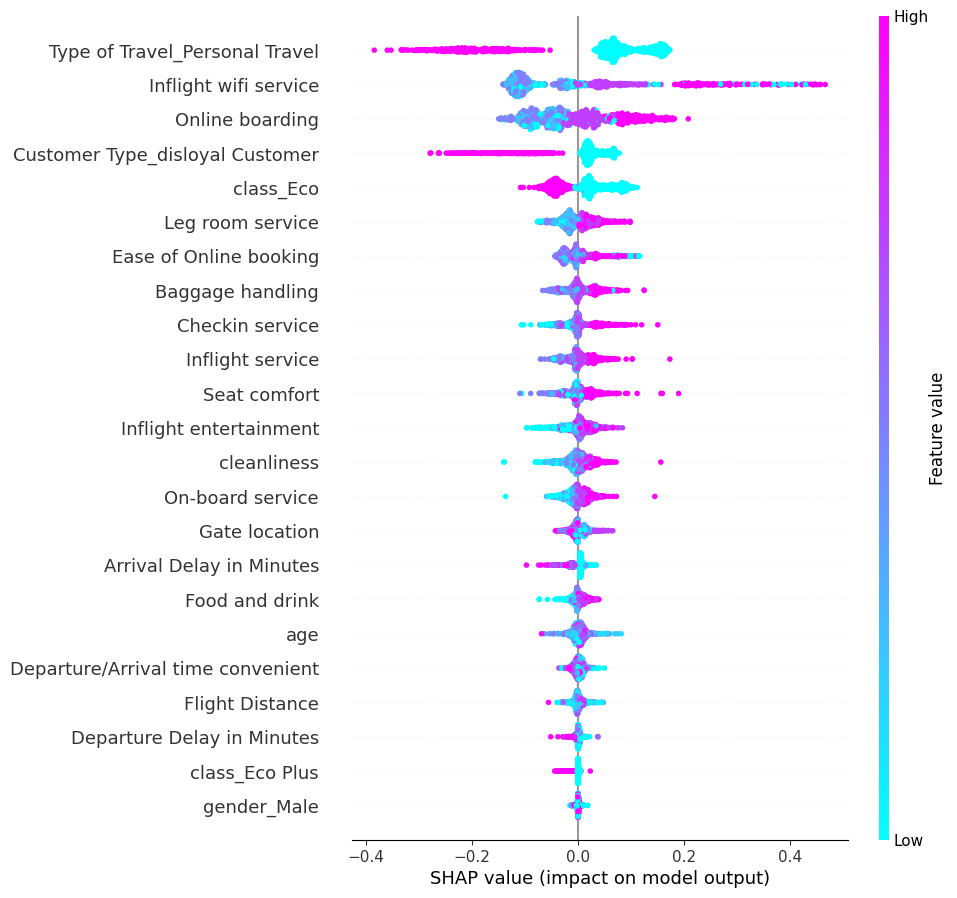

In [ ]:
shap.plots.beeswarm(shap_values[:,:,1], max_display=23, order=shap.Explanation.abs.mean(0), color=plt.get_cmap("cool"))

<font color='#FF6600'>Опишите полученый график</font>

In [ ]:
# your explanation below


График beeswarm показывает сводную информацию о том, как основные признаки в наборе данных влияют на выходные данные модели.

Каждая горизонтальная линия соответствует одному признаку, и на этой линии отмечаются точки, соответствующие тестовым примерам:

- Положение точки по оси X определяется значением SHAP (Shapley regression values) этого объекта.

- Цвет используется для отображения значения признака.

-  Если в каком-то участке линии не хватает места для всех точек, линия начинает расти в ширину. Таким образом, для каждого признака схема представляет собой слившееся множество точек, по одной точке для каждого примера

На графике выше мы видим, что характер поездки (по работе/личная) является наиболее важной характеристикой.

Если клиент путешествует НЕ по работе (красный цвет), признак Type of Travel имеет большее SHAP value (горизонтальная ось). Это в свою очередь означает, что удаление этого признака (замена значения  на неопределенное) существенно уменьшит предсказанную вероятность удовлетворенности сервисом авиакомпании.

Можно также заметить, что наличие хорошего WI-fi во время полета также сильно влияет на положительные впечатления клиента.

<font color='#FF6600'>Изучите документацию библиотеки SHAP. Что ещё полезного в ней имеется? </font>

Очень много инструментов для "объяснения" и анализа самых разных моделей, от линеных до глубинного обучения. Можно анализировать предикаты и классификаторы моделей, работающих с текстом и картинками.

Бонус (0.5 балла) <font color='#9933CC'>Интерпретируйте важности признаков с помощью LIME</font>

In [ ]:
# please type your solution below

explainer = lime.lime_tabular.LimeTabularExplainer(X_train_cat.values, feature_names=X_train_cat.columns.values.tolist(),
                                                  verbose=True, mode='classification')
exp = explainer.explain_instance(X_train_cat.values[0], r_forest.predict_proba)
exp.show_in_notebook(show_table=True)

Intercept 0.27642894326714873
Prediction_local [0.37700752]
Right: 0.0


In [ ]:
exp = explainer.explain_instance(X_train_cat.values[300], r_forest.predict_proba)
exp.show_in_notebook(show_table=True)

Intercept 0.27290915908088026
Prediction_local [0.43868274]
Right: 0.26


In [ ]:
exp = explainer.explain_instance(X_train_cat.values[5], r_forest.predict_proba)
exp.show_in_notebook(show_table=True)

Intercept -0.034755106110163636
Prediction_local [1.15279746]
Right: 1.0


<font color='#FF6600'>Опишите полученый график</font>

Выше выведены три графика, с разными результатами классификации клиентов. На каждой визуализации мы видим, как сильно те или иные признаки виляют на решение классификатора. Признаки располагаются в убывающем порядке, чем больше значимость признака для решения классификатора, тем он выше.

- на первом графике выведен объект с отрицательным классом (недовольный клиент). Видим, что несмотря на то, что поездка клиента является рабочей (что расценивается классификатором как важный признак для довольных клиентов), значения других признаков перевешивают эту оценку полностью.

- на втором графике выведен объект, в котором классификатор не до конца уверен в классе объекта, но больше склоняется к недовольному клиенту.

- на третьем графике выведен объект с положительным классом (довольный клиент). Практически все признаки способствовали такому решению классификатора.

<font color='#9933CC'>Случайное лес, дающий лучший скор, сохраните в pickle</font>

In [ ]:
data = {
     'best_model': r_forest,
 }

with open('DT_forest.pkl', 'wb') as f:
    pickle.dump(data, f)

# Обратная связь

Расскажите, как вам это домашнее задание. Было ли оно полезным? Научились ли вы чему то? Насколько сложным по 10-балльной шкале оно вам показалось? Сколько времени у вас ушло на его выполнение? Что следовало ещё в него включить? Было ли что-то лишнее?

Да, домашнее задание было полезное и классное. Самым сложным оказалось отвечать на оранжевые, текстовые вопросы. Процесс формирования мысли очень мучительный и долгий, но пояснять результаты своей работы - нужный навык.

Со стороны обучения моделей или кода не встретил особых сложностей. По шкале сложности от 1 до первой домашки в этом модуле, я бы сказал 7.5.

В общей сложности я делал эту домашку 5-6 дней, или 20-30 часов. Мне трудно сказать, что стоило бы добавить в домашку.

Большое спасибо составителям, проверяющим и  всем причастным!